In [1]:
from WecGrid import WecGrid


In [2]:
wec_grid = WecGrid(case="./IEEE_30_bus.RAW")

In [3]:
wec_grid.initialize_psse()
wec_grid.initialize_pypsa()

    Sets PSSE environment to latest minor version among installed versions of PSSE 35.
    Use psse35.set_minor(n) to set PSSE35 minor version (n) to use.
        Example, for PSSE 35.0.x, use this as: psse35.set_minor(0)

 PSS(R)E Xplore Version 35
 Copyright (c) 1976-2025
 Siemens Industry, Inc.,
 Power Technologies International                            (PTI)
 This program is a confidential  unpublished  work  created  and  first
 licensed in 1976.  It is a trade secret which is the property of  PTI.
 All use,  disclosure,  and/or reproduction not specifically authorized
 by  PTI  is prohibited.   This  program is protected  under  copyright
 laws  of  non-U.S.  countries  and  by  application  of  international
 treaties.  All  Rights  Reserved  Under  The  Copyright  Laws.


           SIEMENS POWER TECHNOLOGIES INTERNATIONAL

    50 BUS POWER SYSTEM SIMULATOR--PSS(R)E Xplore-35.3.2

             INITIATED ON FRI, MAY 09 2025   1:53


case data: 0     100.00  33  0  0  60.00       
record 1:  08/20/93 UW ARCHIVE           100.0  1961 W IEEE 30 Bus Test Case
record 2: 
parsed 30 buses
parsed 21 loads
parsed 2 fixed shunts
parsed 6 generators
parsed 37 branches
parsed 4 transformers
parsed 1 areas
parsed 0 two terminal dc lines
parsed 0 vsc dc lines
parsed 0 transformer corrections
parsed 0 multi-terminal dc lines
parsed 0 multi-section lines
parsed 1 zones
parsed 0 inter-area transfers
parsed 1 owners
parsed 0 facts devices
parsed 0 switched shunts
parsed 0 induction machines
un-parsed lines:
  Q

INFO:pypsa.pf:Performing non-linear load-flow on AC sub-network SubNetwork 0 for snapshots Index(['now'], dtype='object', name='snapshot')
INFO:pypsa.pf:Newton-Raphson solved in 4 iterations with error of 0.000000 in 0.074977 seconds


pyPSA initialized
PyPSA initialized with case file: IEEE_30_bus.RAW.


In [4]:
config = {
    "simLength": 60 * 60 * 12,  # Simulation length of 12 hours
    "Tsample": 300,            # Sampling time of 5 minutes
    "waveHeight": 2.5,         # Wave height in meters
    "wavePeriod": 8,           # Wave period in seconds
}
wec_grid.create_wec(ID=60, model="RM3", farm_size=8, ibus=31, jbus=1, mbase= 1.0, config=config) 

INFO:pypsa.pf:Performing non-linear load-flow on AC sub-network SubNetwork 0 for snapshots Index(['now'], dtype='object', name='snapshot')
INFO:pypsa.pf:Newton-Raphson solved in 4 iterations with error of 0.000000 in 0.061090 seconds


⚠️ Overwriting existing snapshot at 1997-11-03 00:00:00.


In [5]:
wec_grid.psseObj.simulate(load_curve=True)

In [6]:
# import importlib
# import WecGrid
# import plotly
# importlib.reload(WecGrid)
# importlib.reload(plotly)

wec_grid.psseObj.visualizer.plot_bus_voltages()

In [7]:
import importlib
import WecGrid
importlib.reload(WecGrid)
wec_grid.psseObj.visualizer.plot_branch_loading()

In [114]:
wec_grid.psseObj.branch_dataframe

,Line,FROM_BUS,TO_BUS,BR_ID,STATUS,P_MW,Q_MVAR,P_LOSS,Q_LOSS,RATE,...,RATE_B,RATE_C,LENGTH,CUR_PU,AMPS,MAX_PCT,PCTCRPRATE,MAX_MVA,MVA,LOADING_PCT
0,L0,1,2,1,1,1.734306e+02,-21.346388,5.197465,15.565327,130.0,...,0.0,0.0,0.0,1.648484,721.024536,126.806503,134.414886,174.739334,174.739334,134.414877
1,L1,1,3,1,1,8.781483e+01,4.549399,3.120977,11.406755,130.0,...,0.0,0.0,0.0,0.829553,362.835083,63.853226,67.640457,87.932594,87.932594,67.640456
2,L2,1,31,1,1,1.282964e+00,127.080551,1.437444,7.187218,0.0,...,0.0,0.0,0.0,1.198934,524.397461,0.000000,0.000000,127.087021,127.087021,NaN
3,L3,2,4,1,1,4.365936e+01,3.945844,1.017073,3.099397,65.0,...,0.0,0.0,0.0,0.420254,183.813385,65.240341,67.442009,43.837307,43.837307,67.442008
4,L4,2,5,1,1,8.246200e+01,1.804059,2.956969,12.423029,130.0,...,0.0,0.0,0.0,0.790726,345.852600,60.825054,63.447483,82.481728,82.481728,63.447484
5,L5,2,6,1,1,6.039166e+01,0.488742,1.950850,5.919705,65.0,...,0.0,0.0,0.0,0.578974,253.235474,89.072983,92.913300,60.393642,60.393642,92.913293
6,L6,3,4,1,1,8.229162e+01,-3.639800,0.859272,2.467152,130.0,...,0.0,0.0,0.0,0.807001,352.971283,62.077015,63.363132,82.372070,82.372070,63.363134
7,L7,4,6,1,1,7.222211e+01,-16.361469,0.635781,2.211876,90.0,...,0.0,0.0,0.0,0.731930,320.136139,81.325546,82.280243,74.052216,74.052216,82.280238
8,L8,5,7,1,1,-1.478051e+01,11.695345,0.171656,0.432871,70.0,...,0.0,0.0,0.0,0.186613,81.622078,28.546707,26.925623,20.029919,18.847935,26.925621
9,L9,6,7,1,1,3.815503e+01,-2.976104,0.382024,1.173256,130.0,...,0.0,0.0,0.0,0.378830,165.695084,29.140776,29.439173,38.270924,38.270924,29.439171


In [8]:
wec_grid.psseObj.branch_dataframe

,Line,FROM_BUS,TO_BUS,BR_ID,STATUS,P_MW,Q_MVAR,P_LOSS,Q_LOSS,RATE,...,RATE_B,RATE_C,LENGTH,CUR_PU,AMPS,MAX_PCT,PCTCRPRATE,MAX_MVA,MVA,LOADING_PCT
0,L0,1,2,1,1,1.734306e+02,-21.346388,5.197465,15.565327,130.0,...,0.0,0.0,0.0,1.648484,721.024536,126.806503,134.414886,174.739334,174.739334,134.414877
1,L1,1,3,1,1,8.781483e+01,4.549399,3.120977,11.406755,130.0,...,0.0,0.0,0.0,0.829553,362.835083,63.853226,67.640457,87.932594,87.932594,67.640456
2,L2,1,31,1,1,1.282964e+00,127.080551,1.437444,7.187218,0.0,...,0.0,0.0,0.0,1.198934,524.397461,0.000000,0.000000,127.087021,127.087021,NaN
3,L3,2,4,1,1,4.365936e+01,3.945844,1.017073,3.099397,65.0,...,0.0,0.0,0.0,0.420254,183.813385,65.240341,67.442009,43.837307,43.837307,67.442008
4,L4,2,5,1,1,8.246200e+01,1.804059,2.956969,12.423029,130.0,...,0.0,0.0,0.0,0.790726,345.852600,60.825054,63.447483,82.481728,82.481728,63.447484
5,L5,2,6,1,1,6.039166e+01,0.488742,1.950850,5.919705,65.0,...,0.0,0.0,0.0,0.578974,253.235474,89.072983,92.913300,60.393642,60.393642,92.913293
6,L6,3,4,1,1,8.229162e+01,-3.639800,0.859272,2.467152,130.0,...,0.0,0.0,0.0,0.807001,352.971283,62.077015,63.363132,82.372070,82.372070,63.363134
7,L7,4,6,1,1,7.222211e+01,-16.361469,0.635781,2.211876,90.0,...,0.0,0.0,0.0,0.731930,320.136139,81.325546,82.280243,74.052216,74.052216,82.280238
8,L8,5,7,1,1,-1.478051e+01,11.695345,0.171656,0.432871,70.0,...,0.0,0.0,0.0,0.186613,81.622078,28.546707,26.925623,20.029919,18.847935,26.925621
9,L9,6,7,1,1,3.815503e+01,-2.976104,0.382024,1.173256,130.0,...,0.0,0.0,0.0,0.378830,165.695084,29.140776,29.439173,38.270924,38.270924,29.439171


In [ ]:
 # BRANCH loading (%)
        br_ids = snaps[0].branches['BR_ID'].values
        loading_df = pd.DataFrame(
            {snap.time: snap.branches['PCTCRPRATE'].values for snap in snaps},
            index=br_ids
        ).T

In [17]:
wec_grid.pypsaObj.pypsa_object.lines

attribute,bus0,bus1,type,x,r,g,b,s_nom,s_nom_extendable,s_nom_min,...,v_ang_max,sub_network,x_pu,r_pu,g_pu,b_pu,x_pu_eff,r_pu_eff,s_nom_opt,v_nom
Line,,,,,,,,,,,,,,,,,,,,,
L0,1,2,,10.018800,3.345408,0.0,0.0,130.0,False,0.0,...,inf,0,0.000575,0.000192,0.0,0.0,0.000575,0.000192,0.0,132.0
L1,1,3,,28.784448,7.875648,0.0,0.0,130.0,False,0.0,...,inf,0,0.001652,0.000452,0.0,0.0,0.001652,0.000452,0.0,132.0
L2,2,4,,30.265488,9.931680,0.0,0.0,65.0,False,0.0,...,inf,0,0.001737,0.000570,0.0,0.0,0.001737,0.000570,0.0,132.0
L3,2,5,,34.551792,8.224128,0.0,0.0,130.0,False,0.0,...,inf,0,0.001983,0.000472,0.0,0.0,0.001983,0.000472,0.0,132.0
L4,2,6,,30.718512,10.123344,0.0,0.0,65.0,False,0.0,...,inf,0,0.001763,0.000581,0.0,0.0,0.001763,0.000581,0.0,132.0
L5,3,4,,6.603696,2.299968,0.0,0.0,130.0,False,0.0,...,inf,0,0.000379,0.000132,0.0,0.0,0.000379,0.000132,0.0,132.0
L6,4,6,,7.213536,2.073456,0.0,0.0,90.0,False,0.0,...,inf,0,0.000414,0.000119,0.0,0.0,0.000414,0.000119,0.0,132.0
L7,5,7,,20.211840,8.015040,0.0,0.0,70.0,False,0.0,...,inf,0,0.001160,0.000460,0.0,0.0,0.001160,0.000460,0.0,132.0
L8,6,7,,14.287680,4.652208,0.0,0.0,130.0,False,0.0,...,inf,0,0.000820,0.000267,0.0,0.0,0.000820,0.000267,0.0,132.0


In [ ]:
wec_grid.pypsaObj.simulate(load_curve=True)

✅ Generated load curve for 21 loads over 144 steps.


INFO:pypsa.pf:Performing non-linear load-flow on AC sub-network SubNetwork 0 for snapshots DatetimeIndex(['1997-11-03 00:00:00', '1997-11-03 00:05:00',
               '1997-11-03 00:10:00', '1997-11-03 00:15:00',
               '1997-11-03 00:20:00', '1997-11-03 00:25:00',
               '1997-11-03 00:30:00', '1997-11-03 00:35:00',
               '1997-11-03 00:40:00', '1997-11-03 00:45:00',
               ...
               '1997-11-03 11:10:00', '1997-11-03 11:15:00',
               '1997-11-03 11:20:00', '1997-11-03 11:25:00',
               '1997-11-03 11:30:00', '1997-11-03 11:35:00',
               '1997-11-03 11:40:00', '1997-11-03 11:45:00',
               '1997-11-03 11:50:00', '1997-11-03 11:55:00'],
              dtype='datetime64[ns]', name='snapshot', length=144, freq='5T')
INFO:pypsa.pf:Newton-Raphson solved in 4 iterations with error of 0.000000 in 0.062982 seconds
INFO:pypsa.pf:Newton-Raphson solved in 4 iterations with error of 0.000000 in 0.073054 seconds
INFO:pypsa.

In [7]:
wec_grid.pypsaObj.get_line_load()

,L0,L1,L2,L3,L4,L5,L6,L7,L8,L9,...,L15,L18,L20,L21,L22,L23,L25,L26,L27,WEC_line
snapshot,,,,,,,,,,,,,,,,,,,,,
1997-11-03 00:00:00,134.404218,67.813588,68.818151,63.680187,93.193037,63.152070,81.027922,30.797486,29.253124,110.935507,...,27.461817,26.775011,66.039925,64.711265,15.013957,45.802496,40.239617,25.210397,39.881004,299.661133
1997-11-03 00:05:00,134.583551,67.891532,68.883362,63.747534,93.287065,63.223790,81.121525,30.830340,29.284193,111.092041,...,27.491008,26.790122,66.091523,64.745346,15.020458,45.835339,40.253002,25.222237,39.924247,299.724493
1997-11-03 00:10:00,134.604313,67.900556,68.890912,63.755331,93.297951,63.232093,81.132361,30.834143,29.287790,111.110167,...,27.494388,26.791872,66.097497,64.749293,15.021210,45.839142,40.254552,25.223608,39.929253,299.723422
1997-11-03 00:15:00,134.627131,67.910473,68.899210,63.763899,93.309915,63.241218,81.144270,30.838323,29.291743,111.130088,...,27.498101,26.793795,66.104063,64.753630,15.022038,45.843321,40.256256,25.225115,39.934755,299.725099
1997-11-03 00:20:00,134.652163,67.921353,68.908312,63.773299,93.323040,63.251228,81.157335,30.842909,29.296079,111.151944,...,27.502176,26.795906,66.111266,64.758389,15.022946,45.847906,40.258126,25.226769,39.940790,299.727942
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1997-11-03 11:35:00,134.652163,67.921353,68.908312,63.773299,93.323040,63.251228,81.157335,30.842909,29.296079,111.151944,...,27.502176,26.795906,66.111266,64.758389,15.022946,45.847906,40.258126,25.226769,39.940790,299.720661
1997-11-03 11:40:00,134.627131,67.910473,68.899210,63.763899,93.309915,63.241218,81.144270,30.838323,29.291743,111.130088,...,27.498101,26.793795,66.104063,64.753630,15.022038,45.843321,40.256256,25.225115,39.934755,299.747240
1997-11-03 11:45:00,134.604313,67.900556,68.890912,63.755331,93.297951,63.232093,81.132361,30.834143,29.287790,111.110167,...,27.494388,26.791872,66.097497,64.749293,15.021210,45.839142,40.254552,25.223608,39.929253,299.719924


In [26]:
import numpy as np
import pandas as pd

network = wec_grid.pypsaObj.pypsa_object

p0 = network.lines_t.p0
q0 = network.lines_t.q0
s_nom = network.lines.s_nom

# Ensure valid overlapping lines
valid_lines = s_nom[s_nom > 0].index.intersection(p0.columns)

# Filter
p0 = p0[valid_lines]
q0 = q0[valid_lines]
s_nom = s_nom[valid_lines]

# Broadcast s_nom across time steps
s_limit = pd.DataFrame(1.0, index=p0.index, columns=valid_lines).multiply(s_nom, axis=1)

# Compute loading %
loading_pct = np.sqrt(p0**2 + q0**2).divide(s_limit) * 100
loading_pct

,L0,L1,L2,L3,L4,L5,L6,L7,L8,L9,...,L15,L18,L20,L21,L22,L23,L25,L26,L27,WEC_line
snapshot,,,,,,,,,,,,,,,,,,,,,
1997-11-03 00:00:00,134.404218,67.813588,68.818151,63.680187,93.193037,63.152070,81.027922,30.797486,29.253124,110.935507,...,27.461817,26.775011,66.039925,64.711265,15.013957,45.802496,40.239617,25.210397,39.881004,299.661133
1997-11-03 00:05:00,134.583551,67.891532,68.883362,63.747534,93.287065,63.223790,81.121525,30.830340,29.284193,111.092041,...,27.491008,26.790122,66.091523,64.745346,15.020458,45.835339,40.253002,25.222237,39.924247,299.724493
1997-11-03 00:10:00,134.604313,67.900556,68.890912,63.755331,93.297951,63.232093,81.132361,30.834143,29.287790,111.110167,...,27.494388,26.791872,66.097497,64.749293,15.021210,45.839142,40.254552,25.223608,39.929253,299.723422
1997-11-03 00:15:00,134.627131,67.910473,68.899210,63.763899,93.309915,63.241218,81.144270,30.838323,29.291743,111.130088,...,27.498101,26.793795,66.104063,64.753630,15.022038,45.843321,40.256256,25.225115,39.934755,299.725099
1997-11-03 00:20:00,134.652163,67.921353,68.908312,63.773299,93.323040,63.251228,81.157335,30.842909,29.296079,111.151944,...,27.502176,26.795906,66.111266,64.758389,15.022946,45.847906,40.258126,25.226769,39.940790,299.727942
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1997-11-03 11:35:00,134.652163,67.921353,68.908312,63.773299,93.323040,63.251228,81.157335,30.842909,29.296079,111.151944,...,27.502176,26.795906,66.111266,64.758389,15.022946,45.847906,40.258126,25.226769,39.940790,299.720661
1997-11-03 11:40:00,134.627131,67.910473,68.899210,63.763899,93.309915,63.241218,81.144270,30.838323,29.291743,111.130088,...,27.498101,26.793795,66.104063,64.753630,15.022038,45.843321,40.256256,25.225115,39.934755,299.747240
1997-11-03 11:45:00,134.604313,67.900556,68.890912,63.755331,93.297951,63.232093,81.132361,30.834143,29.287790,111.110167,...,27.494388,26.791872,66.097497,64.749293,15.021210,45.839142,40.254552,25.223608,39.929253,299.719924


In [14]:
network = wec_grid.pypsaObj.pypsa_object
p0 = network.lines_t.p0
q0 = network.lines_t.q0

In [15]:
p0

,L0,L1,L2,L3,L4,L5,L6,L7,L8,L9,...,L28,L29,L30,L31,L32,L33,L34,L35,L36,WEC_line
snapshot,,,,,,,,,,,,,,,,,,,,,
1997-11-03 00:00:00,173.745322,87.583508,43.805813,82.684204,60.338532,82.057092,70.993911,-14.488560,37.880166,29.763752,...,-2.181024,5.151739,2.082241,-1.530479,3.546479,-5.081419,6.193930,7.097088,3.704934,2.997602e-14
1997-11-03 00:05:00,173.974107,87.685584,43.848652,82.772204,60.400340,82.149520,71.071807,-14.503256,37.919466,29.794706,...,-2.183049,5.157274,2.084000,-1.532170,3.550132,-5.086773,6.200405,7.104520,3.708772,1.342422e-01
1997-11-03 00:10:00,174.000596,87.697401,43.853611,82.782392,60.407495,82.160220,71.080825,-14.504957,37.924015,29.798289,...,-2.183284,5.157915,2.084204,-1.532366,3.550554,-5.087393,6.201155,7.105380,3.709216,1.319787e-01
1997-11-03 00:15:00,174.029706,87.710388,43.859062,82.793588,60.415359,82.171979,71.090735,-14.506826,37.929015,29.802227,...,-2.183541,5.158619,2.084428,-1.532581,3.551019,-5.088074,6.201979,7.106325,3.709704,1.355226e-01
1997-11-03 00:20:00,174.061640,87.724636,43.865041,82.805871,60.423986,82.184879,71.101607,-14.508877,37.934500,29.806548,...,-2.183824,5.159391,2.084673,-1.532817,3.551529,-5.088821,6.202882,7.107363,3.710240,1.415297e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1997-11-03 11:35:00,174.061640,87.724636,43.865041,82.805871,60.423986,82.184879,71.101607,-14.508877,37.934500,29.806548,...,-2.183824,5.159391,2.084673,-1.532817,3.551529,-5.088821,6.202882,7.107363,3.710240,1.261440e-01
1997-11-03 11:40:00,174.029706,87.710388,43.859062,82.793588,60.415359,82.171979,71.090735,-14.506826,37.929015,29.802227,...,-2.183541,5.158619,2.084428,-1.532581,3.551019,-5.088074,6.201979,7.106325,3.709704,1.822558e-01
1997-11-03 11:45:00,174.000596,87.697401,43.853611,82.782392,60.407495,82.160220,71.080825,-14.504957,37.924015,29.798289,...,-2.183284,5.157915,2.084204,-1.532366,3.550554,-5.087393,6.201155,7.105380,3.709216,1.245880e-01


In [18]:
network.lines

attribute,bus0,bus1,type,x,r,g,b,s_nom,s_nom_extendable,s_nom_min,...,v_ang_max,sub_network,x_pu,r_pu,g_pu,b_pu,x_pu_eff,r_pu_eff,s_nom_opt,v_nom
Line,,,,,,,,,,,,,,,,,,,,,
L0,1,2,,10.018800,3.345408,0.0,0.0,130.0,False,0.0,...,inf,0,0.000575,0.000192,0.0,0.0,0.000575,0.000192,0.0,132.0
L1,1,3,,28.784448,7.875648,0.0,0.0,130.0,False,0.0,...,inf,0,0.001652,0.000452,0.0,0.0,0.001652,0.000452,0.0,132.0
L2,2,4,,30.265488,9.931680,0.0,0.0,65.0,False,0.0,...,inf,0,0.001737,0.000570,0.0,0.0,0.001737,0.000570,0.0,132.0
L3,2,5,,34.551792,8.224128,0.0,0.0,130.0,False,0.0,...,inf,0,0.001983,0.000472,0.0,0.0,0.001983,0.000472,0.0,132.0
L4,2,6,,30.718512,10.123344,0.0,0.0,65.0,False,0.0,...,inf,0,0.001763,0.000581,0.0,0.0,0.001763,0.000581,0.0,132.0
L5,3,4,,6.603696,2.299968,0.0,0.0,130.0,False,0.0,...,inf,0,0.000379,0.000132,0.0,0.0,0.000379,0.000132,0.0,132.0
L6,4,6,,7.213536,2.073456,0.0,0.0,90.0,False,0.0,...,inf,0,0.000414,0.000119,0.0,0.0,0.000414,0.000119,0.0,132.0
L7,5,7,,20.211840,8.015040,0.0,0.0,70.0,False,0.0,...,inf,0,0.001160,0.000460,0.0,0.0,0.001160,0.000460,0.0,132.0
L8,6,7,,14.287680,4.652208,0.0,0.0,130.0,False,0.0,...,inf,0,0.000820,0.000267,0.0,0.0,0.000820,0.000267,0.0,132.0


In [23]:
s_nom = network.lines.s_nom
s_nom

Line
L0          130.0
L1          130.0
L2           65.0
L3          130.0
L4           65.0
L5          130.0
L6           90.0
L7           70.0
L8          130.0
L9           32.0
L10           0.0
L11           0.0
L12           0.0
L13          65.0
L14           0.0
L15          32.0
L16           0.0
L17           0.0
L18          65.0
L19           0.0
L20          32.0
L21          16.0
L22          16.0
L23          16.0
L24           0.0
L25          16.0
L26          16.0
L27          16.0
L28           0.0
L29           0.0
L30           0.0
L31           0.0
L32           0.0
L33           0.0
L34           0.0
L35           0.0
L36           0.0
WEC_line     40.0
Name: s_nom, dtype: float64

In [7]:
wec_grid.psseObj.branch_dataframe

,FROM_BUS,TO_BUS,BR_ID,STATUS,P_MW,Q_MVAR,P_LOSS,Q_LOSS,RATE,RATE_A,RATE_B,RATE_C,LENGTH,CUR_PU,AMPS,MAX_PCT,PCTCRPRATE,MAX_MVA,MVA,LOADING_PCT
0,1,2,1,1,1.734306e+02,-21.346388,5.197465,15.565327,130.0,130.0,0.0,0.0,0.0,1.648484,721.024536,126.806503,134.414886,174.739334,174.739334,134.414877
1,1,3,1,1,8.781483e+01,4.549399,3.120977,11.406755,130.0,130.0,0.0,0.0,0.0,0.829553,362.835083,63.853226,67.640457,87.932594,87.932594,67.640456
2,1,31,1,1,1.282964e+00,127.080551,1.437444,7.187218,0.0,0.0,0.0,0.0,0.0,1.198934,524.397461,0.000000,0.000000,127.087021,127.087021,NaN
3,2,4,1,1,4.365936e+01,3.945844,1.017073,3.099397,65.0,65.0,0.0,0.0,0.0,0.420254,183.813385,65.240341,67.442009,43.837307,43.837307,67.442008
4,2,5,1,1,8.246200e+01,1.804059,2.956969,12.423029,130.0,130.0,0.0,0.0,0.0,0.790726,345.852600,60.825054,63.447483,82.481728,82.481728,63.447484
5,2,6,1,1,6.039166e+01,0.488742,1.950850,5.919705,65.0,65.0,0.0,0.0,0.0,0.578974,253.235474,89.072983,92.913300,60.393642,60.393642,92.913293
6,3,4,1,1,8.229162e+01,-3.639800,0.859272,2.467152,130.0,130.0,0.0,0.0,0.0,0.807001,352.971283,62.077015,63.363132,82.372070,82.372070,63.363134
7,4,6,1,1,7.222211e+01,-16.361469,0.635781,2.211876,90.0,90.0,0.0,0.0,0.0,0.731930,320.136139,81.325546,82.280243,74.052216,74.052216,82.280238
8,5,7,1,1,-1.478051e+01,11.695345,0.171656,0.432871,70.0,70.0,0.0,0.0,0.0,0.186613,81.622078,28.546707,26.925623,20.029919,18.847935,26.925621
9,6,7,1,1,3.815503e+01,-2.976104,0.382024,1.173256,130.0,130.0,0.0,0.0,0.0,0.378830,165.695084,29.140776,29.439173,38.270924,38.270924,29.439171


In [15]:
network = wec_grid.pypsaObj.pypsa_object

p0 = network.lines_t.p0
q0 = network.lines_t.q0
s_nom = network.lines.s_nom
s_max_pu = network.lines_t.s_max_pu

# Align indices: only lines with nonzero nominal power AND present in p0
valid_lines = s_nom[s_nom > 0].index.intersection(p0.columns)

# Filter all arrays to shared valid lines
p0 = p0[valid_lines]
q0 = q0[valid_lines]
s_nom = s_nom[valid_lines]
s_max_pu = s_max_pu[valid_lines]

# Multiply nominal limit (static) with s_max_pu (time-varying)
s_limit = s_max_pu.multiply(s_nom, axis=1)

# Compute loading percentage
loading_pct = np.sqrt(p0**2 + q0**2).divide(s_limit) * 100

KeyError: "None of [Index(['L0', 'L1', 'L2', 'L3', 'L4', 'L5', 'L6', 'L7', 'L8', 'L9', 'L13',\n       'L15', 'L18', 'L20', 'L21', 'L22', 'L23', 'L25', 'L26', 'L27',\n       'WEC_line'],\n      dtype='object')] are in the [columns]"

In [10]:
loading_pct

,L0,L1,L2,L3,L4,L5,L6,L7,L8,L9,...,L28,L29,L30,L31,L32,L33,L34,L35,L36,WEC_line
snapshot,,,,,,,,,,,,,,,,,,,,,
1997-11-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1997-11-03 00:05:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1997-11-03 00:10:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1997-11-03 00:15:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1997-11-03 00:20:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1997-11-03 11:35:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1997-11-03 11:40:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1997-11-03 11:45:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
wec_grid.pypsaObj.pypsa_object.lines_t.s_max_pu

Line
snapshot
1997-11-03 00:00:00
1997-11-03 00:05:00
1997-11-03 00:10:00
1997-11-03 00:15:00
1997-11-03 00:20:00
...
1997-11-03 11:35:00
1997-11-03 11:40:00
1997-11-03 11:45:00


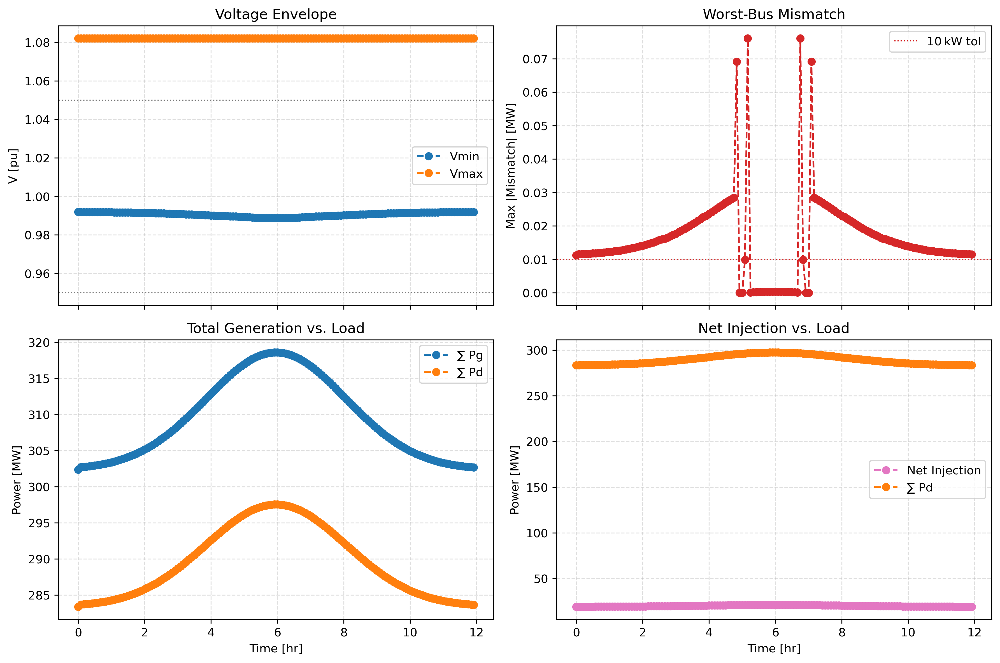

In [6]:
wec_grid.psseObj.visualizer.plot_grid_health()

In [7]:
wec_grid.psseObj.visualizer.sld()

NameError: name 'nx' is not defined

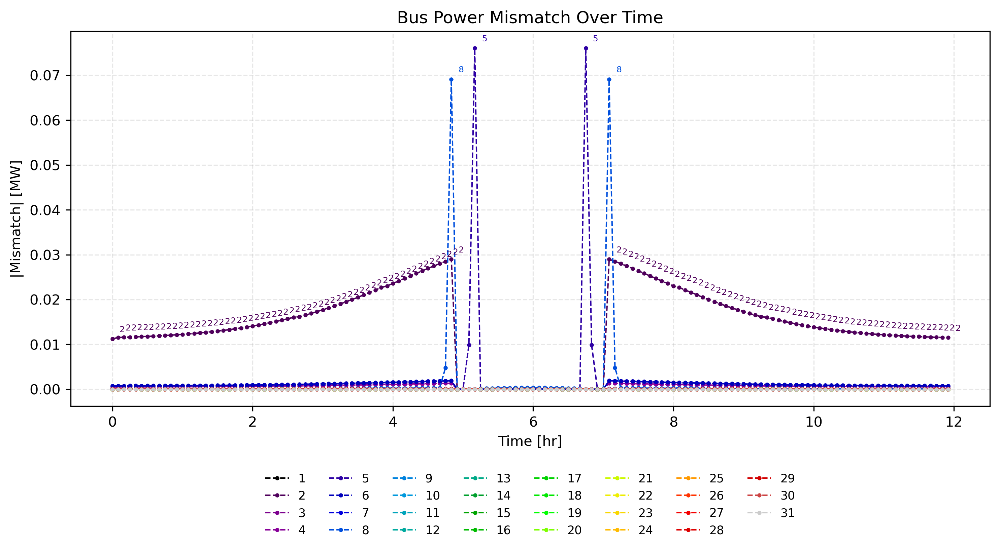

In [7]:
wec_grid.psseObj.visualizer.plot_bus_mismatches()

In [11]:
for snap in wec_grid.psseObj.snapshot_history:
    t = snap.time
    # turn t into a nicely‐formatted string
    t_str = t.strftime("%Y-%m-%d %H:%M:%S")
    df   = snap.buses.set_index("BUS_ID")

    p5, m5 = df.at[5,  "Pd"], abs(df.at[5,  "MISMATCH"])
    p8, m8 = df.at[8,  "Pd"], abs(df.at[8,  "MISMATCH"])

    # only show the “interesting” snapshots
    if m5 > 1e-3 or m8 > 1e-3:
        print(
            f"{t_str:19s}   "
            f"Pd5={p5:6.2f} MW, M5={m5:.4f} MW   |   "
            f"Pd8={p8:6.2f} MW, M8={m8:.4f} MW"
        )

1997-11-03 02:30:00   Pd5= 95.42 MW, M5=0.0010 MW   |   Pd8= 30.39 MW, M8=0.0001 MW
1997-11-03 02:35:00   Pd5= 95.51 MW, M5=0.0010 MW   |   Pd8= 30.42 MW, M8=0.0001 MW
1997-11-03 02:40:00   Pd5= 95.59 MW, M5=0.0011 MW   |   Pd8= 30.44 MW, M8=0.0001 MW
1997-11-03 02:45:00   Pd5= 95.68 MW, M5=0.0011 MW   |   Pd8= 30.47 MW, M8=0.0001 MW
1997-11-03 02:50:00   Pd5= 95.77 MW, M5=0.0011 MW   |   Pd8= 30.50 MW, M8=0.0001 MW
1997-11-03 02:55:00   Pd5= 95.86 MW, M5=0.0011 MW   |   Pd8= 30.53 MW, M8=0.0002 MW
1997-11-03 03:00:00   Pd5= 95.96 MW, M5=0.0012 MW   |   Pd8= 30.56 MW, M8=0.0002 MW
1997-11-03 03:05:00   Pd5= 96.06 MW, M5=0.0012 MW   |   Pd8= 30.59 MW, M8=0.0002 MW
1997-11-03 03:10:00   Pd5= 96.16 MW, M5=0.0012 MW   |   Pd8= 30.62 MW, M8=0.0002 MW
1997-11-03 03:15:00   Pd5= 96.26 MW, M5=0.0012 MW   |   Pd8= 30.66 MW, M8=0.0002 MW
1997-11-03 03:20:00   Pd5= 96.37 MW, M5=0.0013 MW   |   Pd8= 30.69 MW, M8=0.0002 MW
1997-11-03 03:25:00   Pd5= 96.47 MW, M5=0.0013 MW   |   Pd8= 30.72 MW, M8=0.

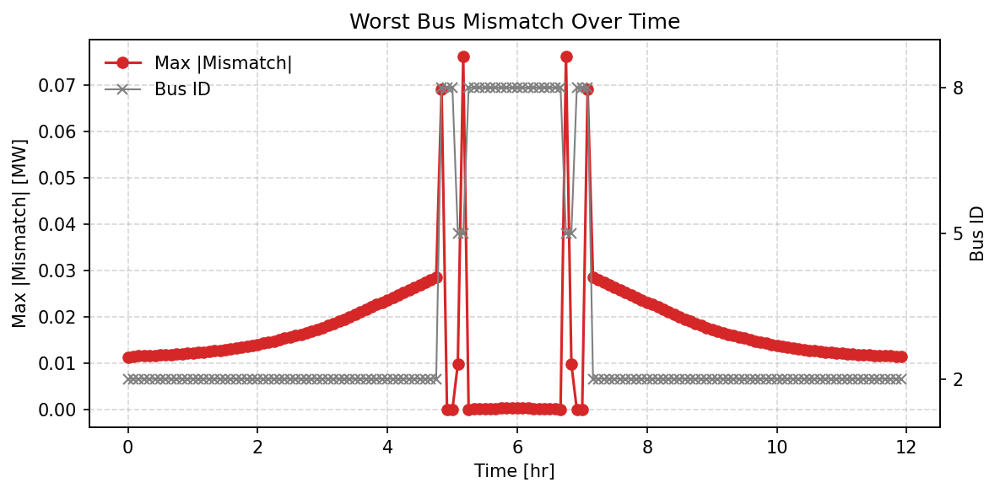

In [7]:
wec_grid.psseObj.visualizer.plot_worst_mismatch()

NameError: name 'hrs' is not defined

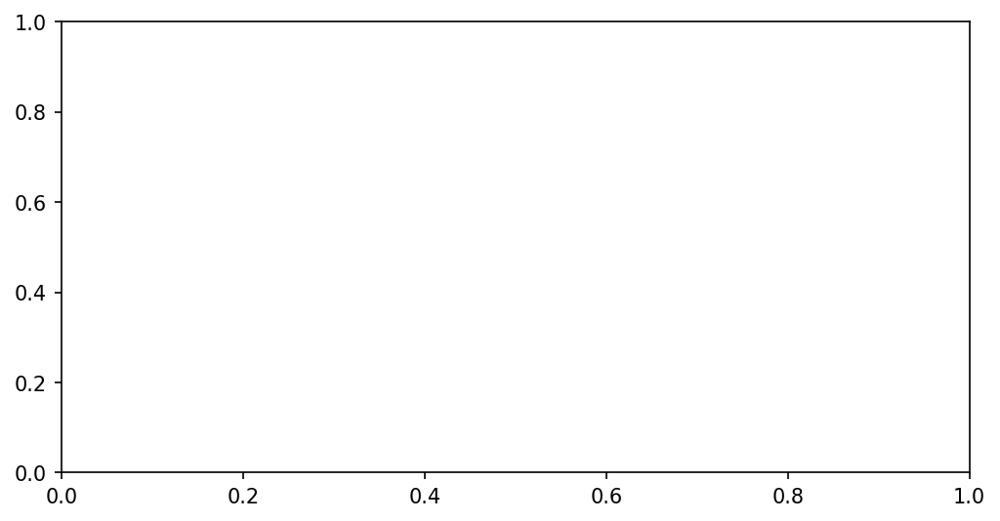

In [8]:
wec_grid.psseObj.visualizer.plot_worst_mismatch_with_annotations()

In [7]:
wec_grid.psseObj.visualizer.plot_generators_interactive()

In [8]:
wec_grid.psseObj.gen_dataframe

,BUS_ID,GEN_ID,Pg,Qg,MBASE,STATUS
0,1,1,262.528381,110.283569,100.0,1
1,2,1,40.000000,50.000000,100.0,1
2,5,1,0.000000,36.908203,100.0,1
3,8,1,0.000000,37.203102,100.0,1
4,11,1,0.000000,16.179651,100.0,1
5,13,1,0.000000,10.629407,100.0,1
6,31,G1,0.019310,-14.986666,1.0,1
7,31,G2,0.019310,-14.986666,1.0,1
8,31,G3,0.019310,-14.986666,1.0,1
9,31,G4,0.019310,-14.986666,1.0,1


In [ ]:

import pandas as pd

rows, times = [], []``
for snap in wec_grid.psseObj.snapshot_history:
    rows.append(snap.generators.set_index('GEN_ID')['Pg'])
    times.append(snap.time)
#df = pd.DataFrame(rows, index=times)


In [11]:
rows

[GEN_ID
 1     262.386505
 1      40.000000
 1       0.000000
 1       0.000000
 1       0.000000
 1       0.000000
 G1      0.000000
 G2      0.000000
 G3      0.000000
 G4      0.000000
 G5      0.000000
 G6      0.000000
 G7      0.000000
 G8      0.000000
 Name: Pg, dtype: float64,
 GEN_ID
 1     262.583252
 1      40.000000
 1       0.000000
 1       0.000000
 1       0.000000
 1       0.000000
 G1      0.016780
 G2      0.016780
 G3      0.016780
 G4      0.016780
 G5      0.016780
 G6      0.016780
 G7      0.016780
 G8      0.016780
 Name: Pg, dtype: float64,
 GEN_ID
 1     262.623749
 1      40.000000
 1       0.000000
 1       0.000000
 1       0.000000
 1       0.000000
 G1      0.016497
 G2      0.016497
 G3      0.016497
 G4      0.016497
 G5      0.016497
 G6      0.016497
 G7      0.016497
 G8      0.016497
 Name: Pg, dtype: float64,
 GEN_ID
 1     262.662262
 1      40.000000
 1       0.000000
 1       0.000000
 1       0.000000
 1       0.000000
 G1      0.016940
 G2  

In [12]:
times

[Timestamp('1997-11-03 00:00:00', freq='5T'),
 Timestamp('1997-11-03 00:05:00', freq='5T'),
 Timestamp('1997-11-03 00:10:00', freq='5T'),
 Timestamp('1997-11-03 00:15:00', freq='5T'),
 Timestamp('1997-11-03 00:20:00', freq='5T'),
 Timestamp('1997-11-03 00:25:00', freq='5T'),
 Timestamp('1997-11-03 00:30:00', freq='5T'),
 Timestamp('1997-11-03 00:35:00', freq='5T'),
 Timestamp('1997-11-03 00:40:00', freq='5T'),
 Timestamp('1997-11-03 00:45:00', freq='5T'),
 Timestamp('1997-11-03 00:50:00', freq='5T'),
 Timestamp('1997-11-03 00:55:00', freq='5T'),
 Timestamp('1997-11-03 01:00:00', freq='5T'),
 Timestamp('1997-11-03 01:05:00', freq='5T'),
 Timestamp('1997-11-03 01:10:00', freq='5T'),
 Timestamp('1997-11-03 01:15:00', freq='5T'),
 Timestamp('1997-11-03 01:20:00', freq='5T'),
 Timestamp('1997-11-03 01:25:00', freq='5T'),
 Timestamp('1997-11-03 01:30:00', freq='5T'),
 Timestamp('1997-11-03 01:35:00', freq='5T'),
 Timestamp('1997-11-03 01:40:00', freq='5T'),
 Timestamp('1997-11-03 01:45:00', 

In [5]:
wec_grid.psseObj.snapshot_history[0]

Snapshot(time=0.0, buses=Ellipsis, generators=Ellipsis, metadata={'step': 'initial'})

In [ ]:
'''
    Import and initialize a WEC grid from a PSS/E RAW file.
'''
from WecGrid import WecGrid

import os
import pandas as pd
import matplotlib.pyplot as plt
wec_grid = WecGrid(case="./IEEE_30_bus.RAW")
wec_grid.initialize_psse("fnsl")
wec_grid.initialize_pypsa("fnsl")


    Sets PSSE environment to latest minor version among installed versions of PSSE 35.
    Use psse35.set_minor(n) to set PSSE35 minor version (n) to use.
        Example, for PSSE 35.0.x, use this as: psse35.set_minor(0)

 PSS(R)E Xplore Version 35
 Copyright (c) 1976-2025
 Siemens Industry, Inc.,
 Power Technologies International                            (PTI)
 This program is a confidential  unpublished  work  created  and  first
 licensed in 1976.  It is a trade secret which is the property of  PTI.
 All use,  disclosure,  and/or reproduction not specifically authorized
 by  PTI  is prohibited.   This  program is protected  under  copyright
 laws  of  non-U.S.  countries  and  by  application  of  international
 treaties.  All  Rights  Reserved  Under  The  Copyright  Laws.


           SIEMENS POWER TECHNOLOGIES INTERNATIONAL

    50 BUS POWER SYSTEM SIMULATOR--PSS(R)E Xplore-35.3.2

             INITIATED ON MON, MAY 05 2025  16:30

 Reading IC, SBASE, REV, XFRRAT, NXFRAT, BASF

case data: 0     100.00  33  0  0  60.00       
record 1:  08/20/93 UW ARCHIVE           100.0  1961 W IEEE 30 Bus Test Case
record 2: 
parsed 30 buses
parsed 21 loads
parsed 2 fixed shunts
parsed 6 generators
parsed 37 branches
parsed 4 transformers
parsed 1 areas
parsed 0 two terminal dc lines
parsed 0 vsc dc lines
parsed 0 transformer corrections
parsed 0 multi-terminal dc lines
parsed 0 multi-section lines
parsed 1 zones
parsed 0 inter-area transfers
parsed 1 owners
parsed 0 facts devices
parsed 0 switched shunts
parsed 0 induction machines
un-parsed lines:
  Q

INFO:pypsa.pf:Performing non-linear load-flow on AC sub-network SubNetwork 0 for snapshots Index(['now'], dtype='object', name='snapshot')
INFO:pypsa.pf:Newton-Raphson solved in 4 iterations with error of 0.000000 in 0.046870 seconds


pyPSA initialized
PyPSA initialized with case file: IEEE_30_bus.RAW.


In [ ]:
'''
    Create a WEC grid with a specific configuration.
    The configuration includes parameters like simulation length, sampling time,
    wave height, and wave period.
'''
config = {
    "simLength": 60 * 60 * 12,  # Simulation length of 12 hours
    "Tsample": 300,            # Sampling time of 5 minutes
    "waveHeight": 2.5,         # Wave height in meters
    "wavePeriod": 8,           # Wave period in seconds
}
wec_grid.create_wec(ID=60, model="RM3", farm_size=8, ibus=31, jbus=1, mbase= 1.0, config=config) 


INFO:pypsa.pf:Performing non-linear load-flow on AC sub-network SubNetwork 0 for snapshots Index(['now'], dtype='object', name='snapshot')
INFO:pypsa.pf:Newton-Raphson solved in 4 iterations with error of 0.000000 in 0.031248 seconds


⚠️ Overwriting existing snapshot at 1997-11-03 00:00:00.
Adding WECs to PSS/E network

 Bus 31 [RM3-31      132.00] added. Power flow data items with non-default values:
 X--DEFAULT---X  X---ACTUAL---X  DATA ITEM
          1               2      IDE
    0.00000         132.000      BASKV
 "            "  "RM3-31      "  NAME
Bus 31 added successfully.

 Plant at bus 31 [RM3-31      132.00] added. Data items with non-default values:
 X--DEFAULT---X  X---ACTUAL---X  DATA ITEM
          0              31      IREG
Plant data added successfully to bus 31.

 Non-transformer branch ckt "1" from 1 [GLEN LYN    132.00] to 31 [RM3-31      132.00] added. Power flow data items with non-default values:
 X----------------DEFAULT-----------------X  X-----------------ACTUAL-----------------X  DATA ITEM
                  0.00000                                    0.100000E-01                R
                 0.100000E-03                                0.500000E-01                X
 "                 

In [3]:
'''
    Run the PSSE simulation with load curve enabled.
'''
wec_grid.psseObj.simulate(load_curve=True)

Starting Sim ... 

 No power flow data changed for machine "G1" at bus 31 [RM3-31      132.00]

 No power flow data changed for machine "G2" at bus 31 [RM3-31      132.00]

 No power flow data changed for machine "G3" at bus 31 [RM3-31      132.00]

 No power flow data changed for machine "G4" at bus 31 [RM3-31      132.00]

 No power flow data changed for machine "G5" at bus 31 [RM3-31      132.00]

 No power flow data changed for machine "G6" at bus 31 [RM3-31      132.00]

 No power flow data changed for machine "G7" at bus 31 [RM3-31      132.00]

 No power flow data changed for machine "G8" at bus 31 [RM3-31      132.00]

 No power flow data changed for load "1" at bus 2 [CLAYTOR     132.00]
Load at bus 2 updated to 21.700000762939453 MW for snapshot 1997-11-03 00:00:00.

 No power flow data changed for load "1" at bus 3 [KUMIS       132.00]
Load at bus 3 updated to 2.4000000953674316 MW for snapshot 1997-11-03 00:00:00.

 No power flow data changed for load "1" at bus 4 [HANCOCK 

In [4]:
'''
    Run the pyPSA simulation with load curve enabled.
'''
wec_grid.pypsaObj.simulate(load_curve=True)

✅ Generated load curve for 21 loads over 144 steps.


INFO:pypsa.pf:Performing non-linear load-flow on AC sub-network SubNetwork 0 for snapshots DatetimeIndex(['1997-11-03 00:00:00', '1997-11-03 00:05:00',
               '1997-11-03 00:10:00', '1997-11-03 00:15:00',
               '1997-11-03 00:20:00', '1997-11-03 00:25:00',
               '1997-11-03 00:30:00', '1997-11-03 00:35:00',
               '1997-11-03 00:40:00', '1997-11-03 00:45:00',
               ...
               '1997-11-03 11:10:00', '1997-11-03 11:15:00',
               '1997-11-03 11:20:00', '1997-11-03 11:25:00',
               '1997-11-03 11:30:00', '1997-11-03 11:35:00',
               '1997-11-03 11:40:00', '1997-11-03 11:45:00',
               '1997-11-03 11:50:00', '1997-11-03 11:55:00'],
              dtype='datetime64[ns]', name='snapshot', length=144, freq='5T')
INFO:pypsa.pf:Newton-Raphson solved in 4 iterations with error of 0.000000 in 0.031247 seconds
INFO:pypsa.pf:Newton-Raphson solved in 4 iterations with error of 0.000000 in 0.062492 seconds
INFO:pypsa.

In [5]:
'''
    Save simulation results to a CSV file. 
'''

def export_wec_grid_results(wec_grid, folder="wecgrid_exports"):
    """
    Save PSSE and PyPSA results from wec_grid object into a folder.
    """

    os.makedirs(folder, exist_ok=True)

    # --- PSSE ---
    psse_snapshots = []
    for snap in wec_grid.psseObj.snapshot_history:
        temp = snap.buses.copy()
        temp["timestamp"] = snap.time
        psse_snapshots.append(temp)
    psse_df = pd.concat(psse_snapshots, ignore_index=True)

    psse_df.to_csv(os.path.join(folder, "psse_snapshots.csv"), index=False)
    wec_grid.psseObj.bus_dataframe.to_csv(os.path.join(folder, "psse_buses.csv"), index=False)
    wec_grid.psseObj.gen_dataframe.to_csv(os.path.join(folder, "psse_generators.csv"), index=False)

    # --- PyPSA ---
    bus_df, gen_df = wec_grid.pypsaObj.collect_pypsa_data()

    bus_df.to_csv(os.path.join(folder, "pypsa_buses.csv"), index=False)
    gen_df.to_csv(os.path.join(folder, "pypsa_generators.csv"), index=False)

    print(f"✅ Saved results to {folder}/")

export_wec_grid_results(wec_grid, folder="sim_results")


✅ Saved results to sim_results/


In [6]:
wec_grid.wecObj_list[0].dataframe

,time,ibus,pg,vs,pt,pb,qt,qb,snapshot
0,0.0,1.0,0.000000,1.0,0.000000,0.0,0.000000,0.000000,1997-11-03 00:00:00
1,450.0,1.0,0.016780,1.1,0.016780,0.0,0.057599,-0.057599,1997-11-03 00:05:00
2,750.0,1.0,0.016497,1.1,0.016497,0.0,0.057677,-0.057677,1997-11-03 00:10:00
3,1050.0,1.0,0.016940,1.1,0.016940,0.0,0.057533,-0.057533,1997-11-03 00:15:00
4,1350.0,1.0,0.017691,1.1,0.017691,0.0,0.057250,-0.057250,1997-11-03 00:20:00
...,...,...,...,...,...,...,...,...,...
139,41850.0,1.0,0.015768,1.1,0.015768,0.0,0.057798,-0.057798,1997-11-03 11:35:00
140,42150.0,1.0,0.022782,1.1,0.022782,0.0,0.055365,-0.055365,1997-11-03 11:40:00
141,42450.0,1.0,0.015574,1.1,0.015574,0.0,0.057925,-0.057925,1997-11-03 11:45:00
142,42750.0,1.0,0.014986,1.1,0.014986,0.0,0.058083,-0.058083,1997-11-03 11:50:00


In [7]:
import pandas as pd

# 1) grab your full dataframe
df = wec_grid.wecObj_list[0].dataframe

# 2) pick only the columns you actually want
cols = ['pg', 'vs', 'ibus', 'snapshot']

# 3) take the first N rows (e.g. 10) and round
df2 = df.loc[:, cols].head(10).round(2)

# 4) optionally rename for prettier LaTeX headers
df2 = df2.rename(columns={
    'pg':       '$P_g$ [MW]',
    'vs':       '$V_s$ [p.u.]',
    'ibus':     'I$_{bus}$ [A]',
    'snapshot': 'Time'
})

# 5) emit to a .tex file (no booktabs flag)
latex = df2.to_latex(
    index=False,
    escape=False,            # allow math in headers
    float_format="%.2f",     # fixed‑point with two decimals
    caption="WEC output variables (first 10 snapshots)",
    label="tab:wec_outputs",
    column_format="rrrr"     # four right‑aligned columns
)

with open("wec_outputs.tex", "w") as f:
    f.write(latex)

In [8]:
wec_grid.psseObj.bus_dataframe

,BUS_ID,TYPE,Pd,Qd,Pg,Qg,P,Q,V_PU,V_KV,BASE_KV,ANGLE_DEG,ANGLE_RAD,MISMATCH
0,1,3,0.000000,0.000000,262.528381,110.283569,262.528381,110.283569,1.060000,139.919983,132.0,98.431602,1.717955,1.248945e-05
1,2,2,21.719873,12.700001,40.000000,50.000000,18.280127,37.299999,1.043114,137.691086,132.0,93.073456,1.624438,1.150891e-02
2,3,1,2.402198,1.200000,0.000000,0.000000,-2.402198,-1.200000,1.020718,134.734787,132.0,90.891350,1.586353,3.090869e-05
3,4,1,7.606960,1.600000,0.000000,0.000000,-7.606960,-1.600000,1.011739,133.549576,132.0,89.137245,1.555738,5.298531e-04
4,5,2,94.286263,19.000000,0.000000,36.908203,-94.286263,17.908203,1.010000,133.319992,132.0,84.250351,1.470446,7.271771e-04
5,6,1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.010240,133.351654,132.0,87.354782,1.524628,7.541401e-04
6,7,1,22.820879,10.900000,0.000000,0.000000,-22.820879,-10.900000,1.002363,132.311935,132.0,85.552361,1.493170,5.744683e-05
7,8,2,30.027475,30.000002,0.000000,37.203102,-30.027475,7.203100,1.010000,133.319992,132.0,86.605087,1.511543,8.046972e-05
8,9,1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.050897,1.050897,1.0,84.307587,1.471444,2.980232e-06
9,10,1,5.805312,2.000000,0.000000,0.000000,-5.805312,-2.000000,1.045107,34.488533,33.0,82.715355,1.443655,1.117587e-06


In [9]:
import pandas as pd

# 1) pull your full bus_dataframe
full = wec_grid.psseObj.bus_dataframe

# 2) define the columns you actually want
left  = ['BUS_ID', 'TYPE']
right = ['P', 'Q', 'BASE_KV', 'ANGLE_DEG', 'MISMATCH']

# 3) build the slim version, inserting a latex-dots column
df = full[left].copy()
df['\\dots'] = ''
for c in right:
    df[c] = full[c]

# 4) take only the first N rows (e.g. 10) and round the numeric columns
df = df.head(10)
df[right] = df[right].round(2)

# 5) emit to LaTeX with fixed‐point formatting
latex = df.to_latex(
    index=False,
    escape=False,               # so \dots renders
    float_format="%.2f",        # two decimals, no e‑notation
    caption="Slimmed‐down bus table (omitting intermediate columns)",
    label="tab:bus_slim",
    column_format="llcrrrrr"    # two left, one center (\dots), five right
)

with open("figs/bus_slim_table.tex","w") as f:
    f.write(latex)

In [10]:
wec_grid.psseObj.bus_dataframe

,BUS_ID,TYPE,Pd,Qd,Pg,Qg,P,Q,V_PU,V_KV,BASE_KV,ANGLE_DEG,ANGLE_RAD,MISMATCH
0,1,3,0.000000,0.000000,262.528381,110.283569,262.528381,110.283569,1.060000,139.919983,132.0,98.431602,1.717955,1.248945e-05
1,2,2,21.719873,12.700001,40.000000,50.000000,18.280127,37.299999,1.043114,137.691086,132.0,93.073456,1.624438,1.150891e-02
2,3,1,2.402198,1.200000,0.000000,0.000000,-2.402198,-1.200000,1.020718,134.734787,132.0,90.891350,1.586353,3.090869e-05
3,4,1,7.606960,1.600000,0.000000,0.000000,-7.606960,-1.600000,1.011739,133.549576,132.0,89.137245,1.555738,5.298531e-04
4,5,2,94.286263,19.000000,0.000000,36.908203,-94.286263,17.908203,1.010000,133.319992,132.0,84.250351,1.470446,7.271771e-04
5,6,1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.010240,133.351654,132.0,87.354782,1.524628,7.541401e-04
6,7,1,22.820879,10.900000,0.000000,0.000000,-22.820879,-10.900000,1.002363,132.311935,132.0,85.552361,1.493170,5.744683e-05
7,8,2,30.027475,30.000002,0.000000,37.203102,-30.027475,7.203100,1.010000,133.319992,132.0,86.605087,1.511543,8.046972e-05
8,9,1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.050897,1.050897,1.0,84.307587,1.471444,2.980232e-06
9,10,1,5.805312,2.000000,0.000000,0.000000,-5.805312,-2.000000,1.045107,34.488533,33.0,82.715355,1.443655,1.117587e-06


[Bus 1] RMSE = 0.388 MW, Corr  = 1.000


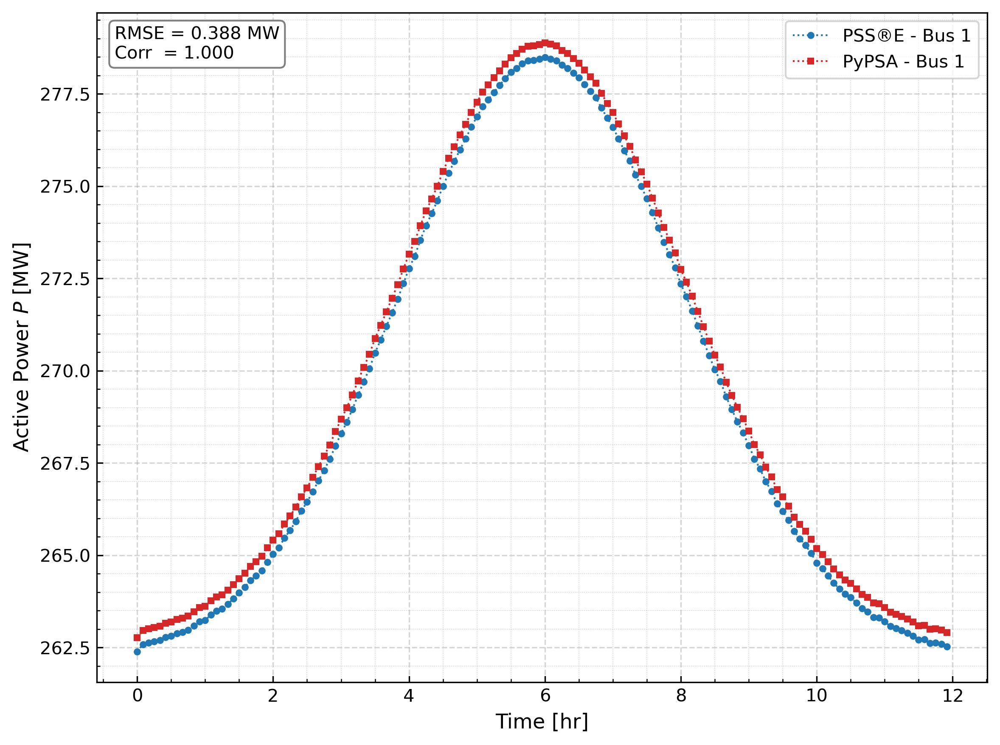

[Bus 31] RMSE = 0.000 MW, Corr  = 1.000


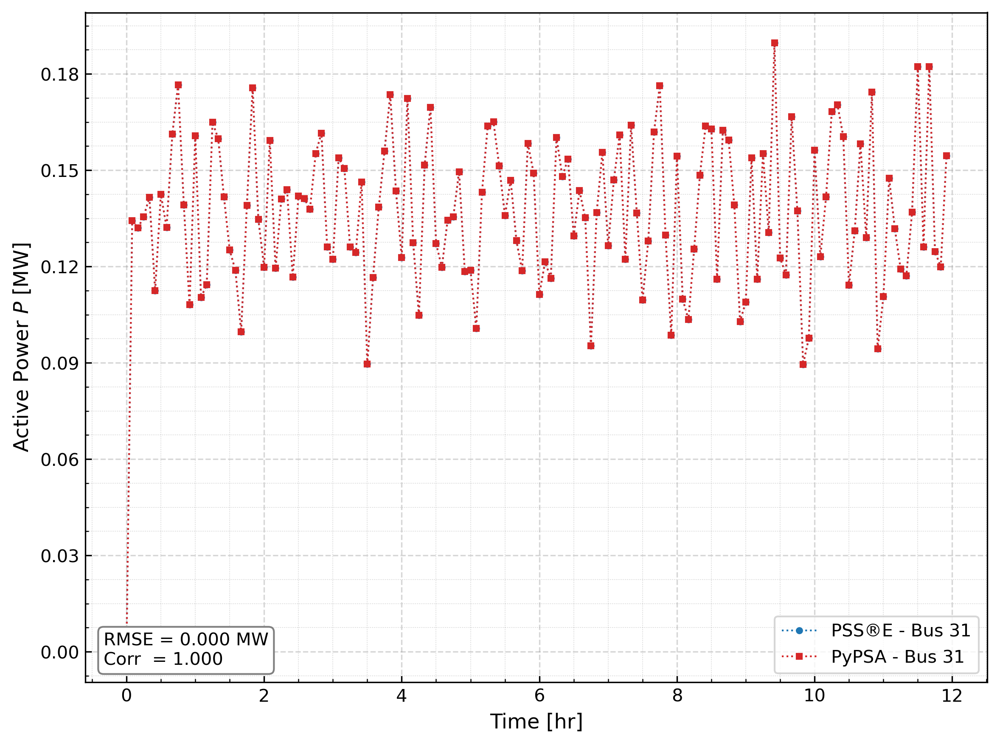

In [11]:
import plot_example as pe

pe.plot_bus_power_comparison(
    wec_grid.psseObj, wec_grid.pypsaObj.pypsa_object, 
    "p", "p", 1,"bus_1_power_comparison.svg",
    psse_label="PSS®E", pypsa_label="PyPSA",
    annotation_loc=None, legend_loc='upper right',
    figsize=(8, 6), dpi=300, 
)

pe.plot_bus_power_comparison(
    wec_grid.psseObj, wec_grid.pypsaObj.pypsa_object, 
    "p", "p", 31,"bus_31_power_comparison.svg",
    psse_label="PSS®E", pypsa_label="PyPSA",
    annotation_loc='lower left', legend_loc='lower right',
    figsize=(8, 6), dpi=300, 
)


[Δθ Bus 1-31] RMSE = 0.000°, Corr  = 1.000


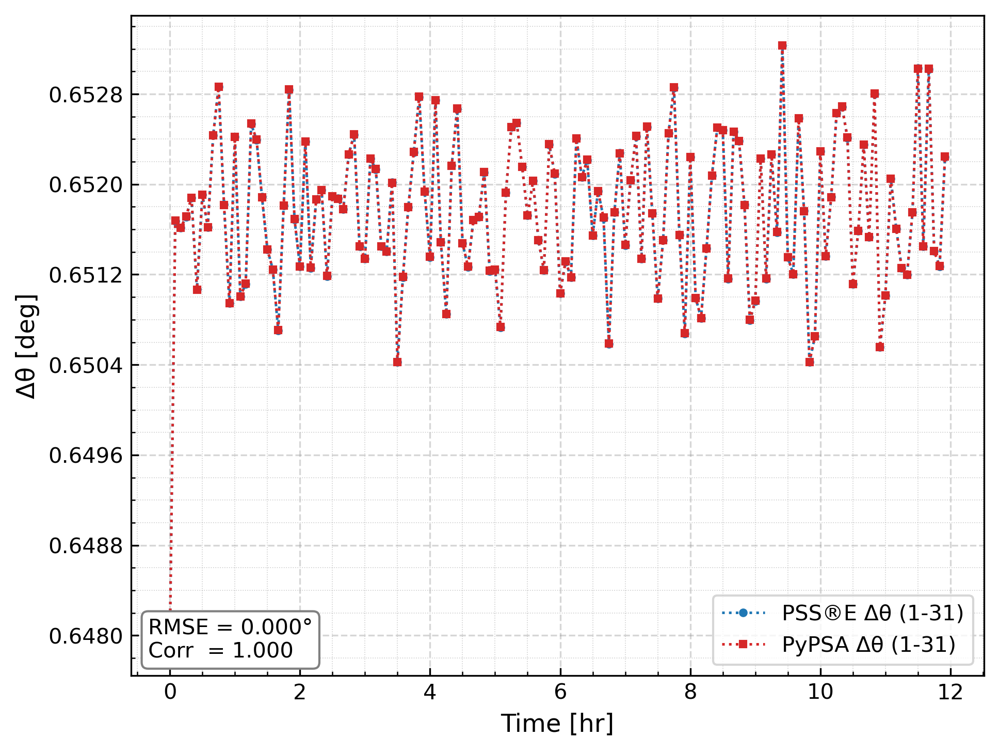

In [12]:
pe.plot_voltage_angle_spread(  
    wec_grid.psseObj, wec_grid.pypsaObj.pypsa_object, 
    1, 31,
    outfile_name="voltage_angle_spread_bus_31.svg",
    annotation_loc="lower left", legend_loc='lower right',
    figsize=(6.6, 5.0), dpi=300)

c:\users\alexb\research\wec-grid\WecGrid\PSSe\psse_wrapper.py:844: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k-" (-> linestyle='-'). The keyword argument will take precedence.
  ax.plot([path[i][0], path[i+1][0]], [path[i][1], path[i+1][1]], 'k-', lw=1.5, linestyle="dashed")


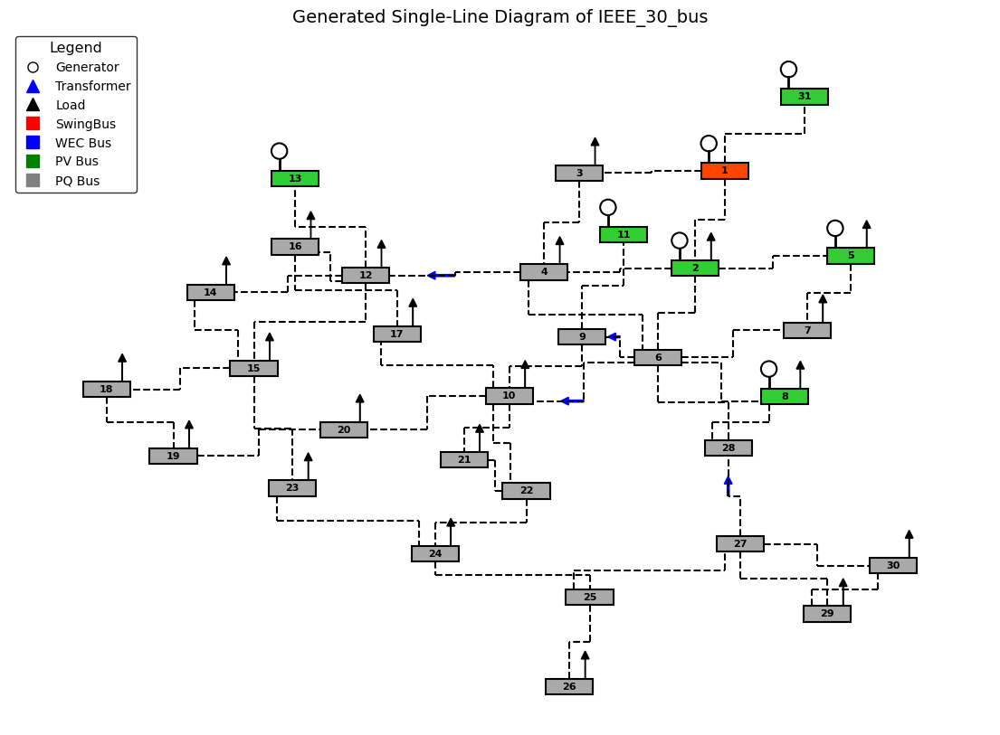

In [13]:
wec_grid.psseObj.sld()

In [14]:
 '''
    No wec for comparison
 '''
wec_grid_noW = WecGrid(case="./IEEE_30_bus.RAW")
wec_grid_noW.initialize_psse("fnsl")
wec_grid_noW.initialize_pypsa("fnsl")


 Reading IC, SBASE, REV, XFRRAT, NXFRAT, BASFRQ...

 Converting RAW data from PSS(R)E 33 to PSS(R)E 34 format
 Starting processing of Case identification data records
 Finished processing of 3 records for Case identification data
 Starting processing of Bus data records
 Finished processing of 30 records for Bus data
 Starting processing of Load data records
 Finished processing of 21 records for Load data
 Starting processing of Fixed shunt data records
 Finished processing of 2 records for Fixed shunt data
 Starting processing of Generator data records
 Finished processing of 6 records for Generator data
 Starting processing of Branch data records
 Finished processing of 37 records for Branch data
 Finished processing of 0 records for System switching device data
 Starting processing of Transformer data records
 Finished processing of 16 records for 4 Transformer data
 Starting processing of Area data records
 Finished processing of 1 records for Area data
 Starting processing of Tw

case data: 0     100.00  33  0  0  60.00       
record 1:  08/20/93 UW ARCHIVE           100.0  1961 W IEEE 30 Bus Test Case
record 2: 
parsed 30 buses
parsed 21 loads
parsed 2 fixed shunts
parsed 6 generators
parsed 37 branches
parsed 4 transformers
parsed 1 areas
parsed 0 two terminal dc lines
parsed 0 vsc dc lines
parsed 0 transformer corrections
parsed 0 multi-terminal dc lines
parsed 0 multi-section lines
parsed 1 zones
parsed 0 inter-area transfers
parsed 1 owners
parsed 0 facts devices
parsed 0 switched shunts
parsed 0 induction machines
un-parsed lines:
  Q

INFO:pypsa.pf:Performing non-linear load-flow on AC sub-network SubNetwork 0 for snapshots Index(['now'], dtype='object', name='snapshot')
INFO:pypsa.pf:Newton-Raphson solved in 4 iterations with error of 0.000000 in 0.031233 seconds


pyPSA initialized
PyPSA initialized with case file: IEEE_30_bus.RAW.


In [18]:
wec_grid_noW.psseObj.simulate(load_curve=True, duration_len=len(wec_grid.wecObj_list[0].dataframe))

Starting Sim ... 

 No power flow data changed for load "1" at bus 2 [CLAYTOR     132.00]
Load at bus 2 updated to 21.700000762939453 MW for snapshot 1997-11-03 00:00:00.

 No power flow data changed for load "1" at bus 3 [KUMIS       132.00]
Load at bus 3 updated to 2.4000000953674316 MW for snapshot 1997-11-03 00:00:00.

 No power flow data changed for load "1" at bus 4 [HANCOCK     132.00]
Load at bus 4 updated to 7.599999904632568 MW for snapshot 1997-11-03 00:00:00.

 No power flow data changed for load "1" at bus 5 [FIELDALE    132.00]
Load at bus 5 updated to 94.19999694824219 MW for snapshot 1997-11-03 00:00:00.

 No power flow data changed for load "1" at bus 7 [BLAINE      132.00]
Load at bus 7 updated to 22.799999237060547 MW for snapshot 1997-11-03 00:00:00.

 No power flow data changed for load "1" at bus 8 [REUSENS     132.00]
Load at bus 8 updated to 30.000001907348633 MW for snapshot 1997-11-03 00:00:00.

 No power flow data changed for load "1" at bus 10 [ROANOKE     3

In [19]:
wec_grid_noW.pypsaObj.simulate(load_curve=True, sim_length=len(wec_grid.wecObj_list[0].dataframe))

✅ Generated load curve for 21 loads over 144 steps.


INFO:pypsa.pf:Performing non-linear load-flow on AC sub-network SubNetwork 0 for snapshots DatetimeIndex(['1997-11-03 00:00:00', '1997-11-03 00:05:00',
               '1997-11-03 00:10:00', '1997-11-03 00:15:00',
               '1997-11-03 00:20:00', '1997-11-03 00:25:00',
               '1997-11-03 00:30:00', '1997-11-03 00:35:00',
               '1997-11-03 00:40:00', '1997-11-03 00:45:00',
               ...
               '1997-11-03 11:10:00', '1997-11-03 11:15:00',
               '1997-11-03 11:20:00', '1997-11-03 11:25:00',
               '1997-11-03 11:30:00', '1997-11-03 11:35:00',
               '1997-11-03 11:40:00', '1997-11-03 11:45:00',
               '1997-11-03 11:50:00', '1997-11-03 11:55:00'],
              dtype='datetime64[ns]', name='snapshot', length=144, freq='5T')
INFO:pypsa.pf:Newton-Raphson solved in 4 iterations with error of 0.000000 in 0.031234 seconds
INFO:pypsa.pf:Newton-Raphson solved in 4 iterations with error of 0.000000 in 0.031252 seconds
INFO:pypsa.

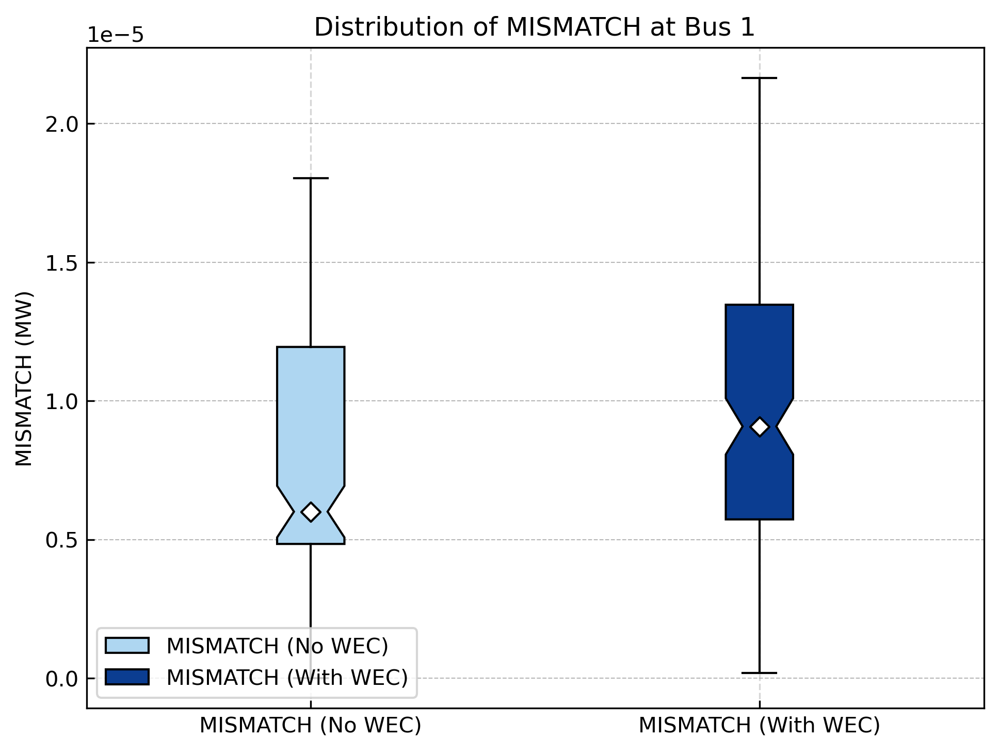

In [20]:

pe.plot_mismatch(
    wec_grid.psseObj, wec_grid_noW.psseObj,
    1,
    outfile_name=f"./figs/mismatch_bus{1}.svg",
    legend_loc='lower left'
)

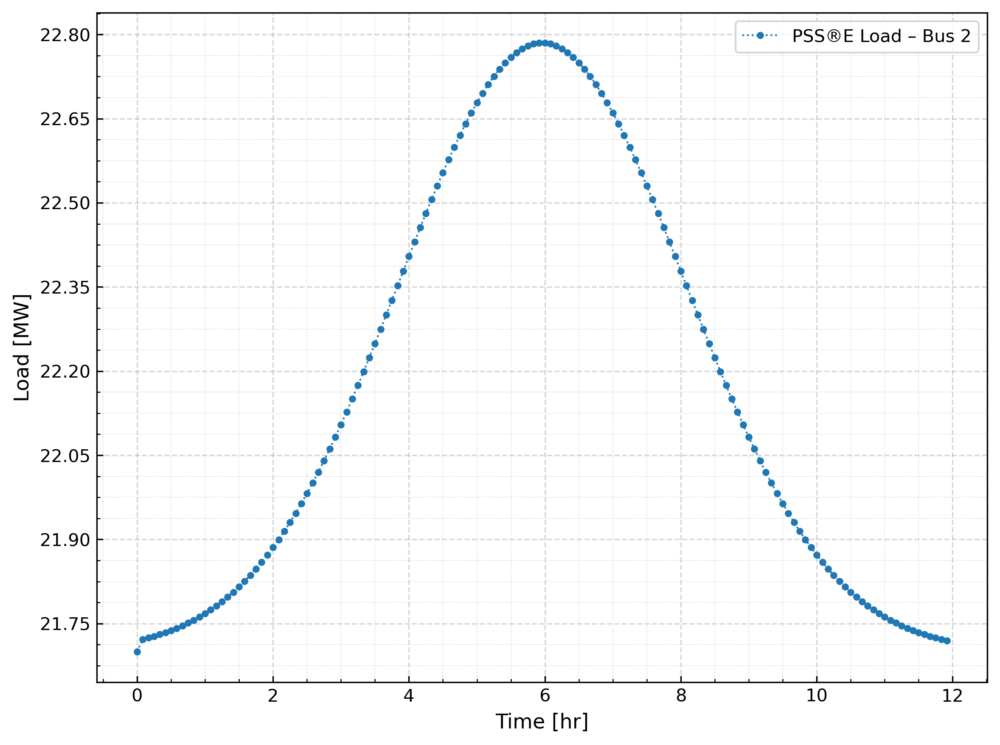

In [21]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def plot_load_profile(
    load_profiles: pd.DataFrame,
    bus_id: int,
    outfile_name: str = "load_profile.svg",
    label: str = "Load Profile",
    legend_loc: str = 'upper right',
    figsize: tuple = (8, 6),
    dpi: int = 300
):
    """
    Plot a single bus load profile with time in hours, styled to match plot_bus_power_comparison.

    Parameters
    ----------
    load_profiles : pd.DataFrame
        Time‑indexed DataFrame of load profiles; columns are bus IDs (ints).
    bus_id : int
        Which bus to plot (must be one of load_profiles.columns).
    outfile_name : str
        Path (with .svg) to save figure.
    label : str
        Legend label for this series.
    legend_loc : str
        Location for the legend.
    figsize : tuple
        Figure size in inches.
    dpi : int
        Figure resolution.
    """
    if bus_id not in load_profiles.columns:
        raise KeyError(f"Bus {bus_id} not found; available: {list(load_profiles.columns)}")

    # 1) grab the series and make sure its index is datetime
    series = load_profiles[bus_id]
    if not isinstance(series.index, pd.DatetimeIndex):
        series.index = pd.to_datetime(series.index)

    # 2) compute time in hours
    t0 = series.index[0]
    time_hr = (series.index - t0).total_seconds() / 3600

    # 3) apply your shared rcParams
    plt.rcParams.update({
        "font.size": 11.5,
        "axes.titlesize": 12,
        "axes.labelsize": 11.5,
        "xtick.labelsize": 10,
        "ytick.labelsize": 10,
        "legend.fontsize": 10,
        "axes.grid": True,
        "grid.alpha": 0.4,
        "grid.color": "#999999",
        "grid.linestyle": "--",
        "xtick.direction": "in",
        "ytick.direction": "in"
    })

    # 4) plot
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    ax.plot(
        time_hr, series.values,
        label=f"{label} – Bus {bus_id}",
        color='#1f77b4',    # matching your PSS®E color
        marker='o', 
        markersize=3.0,
        linestyle=':', 
        linewidth=1
    )

    # 5) axes, grid, ticks
    ax.set_xlabel("Time [hr]")
    ax.set_ylabel("Load [MW]")
    ax.xaxis.set_major_locator(plt.MaxNLocator(8))
    ax.yaxis.set_major_locator(plt.MaxNLocator(8))
    ax.minorticks_on()
    ax.grid(which='minor', linestyle=':', linewidth=0.4, alpha=0.5)

    # 6) legend & finish
    ax.legend(loc=legend_loc, frameon=True)
    plt.tight_layout()
    plt.savefig(outfile_name, format="svg")
    plt.show()
    plt.close()
lp = wec_grid.psseObj.load_profiles
plot_load_profile(
    lp,
    bus_id=2,
    outfile_name="./figs/load_profile_bus2.svg",
    label="PSS®E Load",      # or whatever you like
    legend_loc='upper right'
)

In [26]:
type(wec_grid.psseObj.load_profiles.columns[0])

numpy.int64

In [19]:
wec_grid_noW.pypsaObj.pypsa_object.buses_t.p

Bus,1,2,3,4,5,6,7,8,9,10,...,21,22,23,24,25,26,27,28,29,30
snapshot,,,,,,,,,,,,,,,,,,,,,
1997-11-03 00:00:00,261.328831,18.300000,-2.400000,-7.600000,-94.200000,0.0,-22.800000,-30.000000,0.0,-5.800000,...,-17.500000,0.0,-3.200000,-8.700000,0.0,-3.500000,0.0,0.0,-2.400000,-10.600000
1997-11-03 00:05:00,261.659691,18.277792,-2.402456,-7.607778,-94.296404,0.0,-22.823333,-30.030702,0.0,-5.805936,...,-17.517909,0.0,-3.203275,-8.708904,0.0,-3.503582,0.0,0.0,-2.402456,-10.610848
1997-11-03 00:10:00,261.697997,18.275221,-2.402740,-7.608678,-94.307564,0.0,-22.826035,-30.034256,0.0,-5.806623,...,-17.519983,0.0,-3.203654,-8.709934,0.0,-3.503997,0.0,0.0,-2.402740,-10.612104
1997-11-03 00:15:00,261.740094,18.272396,-2.403053,-7.609668,-94.319829,0.0,-22.829003,-30.038162,0.0,-5.807378,...,-17.522261,0.0,-3.204071,-8.711067,0.0,-3.504452,0.0,0.0,-2.403053,-10.613484
1997-11-03 00:20:00,261.786275,18.269297,-2.403396,-7.610753,-94.333283,0.0,-22.832260,-30.042447,0.0,-5.808206,...,-17.524761,0.0,-3.204528,-8.712310,0.0,-3.504952,0.0,0.0,-2.403396,-10.614998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1997-11-03 11:35:00,261.786275,18.269297,-2.403396,-7.610753,-94.333283,0.0,-22.832260,-30.042447,0.0,-5.808206,...,-17.524761,0.0,-3.204528,-8.712310,0.0,-3.504952,0.0,0.0,-2.403396,-10.614998
1997-11-03 11:40:00,261.740094,18.272396,-2.403053,-7.609668,-94.319829,0.0,-22.829003,-30.038162,0.0,-5.807378,...,-17.522261,0.0,-3.204071,-8.711067,0.0,-3.504452,0.0,0.0,-2.403053,-10.613484
1997-11-03 11:45:00,261.697997,18.275221,-2.402740,-7.608678,-94.307564,0.0,-22.826035,-30.034256,0.0,-5.806623,...,-17.519983,0.0,-3.203654,-8.709934,0.0,-3.503997,0.0,0.0,-2.402740,-10.612104


In [20]:
#calculate mismatch for pyPSA

wec_grid.psseObj.bus_dataframe

,BUS_ID,TYPE,Pd,Qd,Pg,Qg,P,Q,V_PU,V_KV,BASE_KV,ANGLE_DEG,ANGLE_RAD,MISMATCH
0,1,3,0.000000,0.000000,262.528381,110.283569,262.528381,110.283569,1.060000,139.919983,132.0,98.431602,1.717955,1.248945e-05
1,2,2,21.719873,12.700001,40.000000,50.000000,18.280127,37.299999,1.043114,137.691086,132.0,93.073456,1.624438,1.150891e-02
2,3,1,2.402198,1.200000,0.000000,0.000000,-2.402198,-1.200000,1.020718,134.734787,132.0,90.891350,1.586353,3.090869e-05
3,4,1,7.606960,1.600000,0.000000,0.000000,-7.606960,-1.600000,1.011739,133.549576,132.0,89.137245,1.555738,5.298531e-04
4,5,2,94.286263,19.000000,0.000000,36.908203,-94.286263,17.908203,1.010000,133.319992,132.0,84.250351,1.470446,7.271771e-04
5,6,1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.010240,133.351654,132.0,87.354782,1.524628,7.541401e-04
6,7,1,22.820879,10.900000,0.000000,0.000000,-22.820879,-10.900000,1.002363,132.311935,132.0,85.552361,1.493170,5.744683e-05
7,8,2,30.027475,30.000002,0.000000,37.203102,-30.027475,7.203100,1.010000,133.319992,132.0,86.605087,1.511543,8.046972e-05
8,9,1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.050897,1.050897,1.0,84.307587,1.471444,2.980232e-06
9,10,1,5.805312,2.000000,0.000000,0.000000,-5.805312,-2.000000,1.045107,34.488533,33.0,82.715355,1.443655,1.117587e-06


In [36]:
import numpy as np
import pandas as pd

# Get the PyPSA network object
net = wec_grid_noW.pypsaObj.pypsa_object

# Extract all relevant data
P_inj = net.buses_t.p       # Net real power injection (MW)
Q_inj = net.buses_t.q       # Net reactive power injection (MVAr)

P0 = net.lines_t.p0         # Real power leaving bus0 (MW)
P1 = net.lines_t.p1         # Real power leaving bus1 (MW)
Q0 = net.lines_t.q0         # Reactive power leaving bus0 (MVAr)
Q1 = net.lines_t.q1         # Reactive power leaving bus1 (MVAr)

lines = net.lines           # Line connectivity info

# Initialize mismatch DataFrames
P_mism = pd.DataFrame(0.0, index=net.snapshots, columns=net.buses.index)
Q_mism = pd.DataFrame(0.0, index=net.snapshots, columns=net.buses.index)

# Loop over all buses
for bus in net.buses.index:
    # Lines where this bus is bus0 or bus1
    lines_from = lines.index[lines['bus0'] == bus]  # flows: use p0/q0
    lines_to   = lines.index[lines['bus1'] == bus]  # flows: use p1/q1

    # Total real/reactive power flowing out of this bus
    P_out = P0[lines_from].sum(axis=1).fillna(0) + P1[lines_to].sum(axis=1).fillna(0)
    Q_out = Q0[lines_from].sum(axis=1).fillna(0) + Q1[lines_to].sum(axis=1).fillna(0)

    # Power mismatch = net injection + power outflow (should ≈ 0)
    P_mism[bus] = P_inj[bus].fillna(0) + P_out
    Q_mism[bus] = Q_inj[bus].fillna(0) + Q_out

# Calculate total MVA mismatch per bus
MVA_mismatch = np.sqrt(P_mism**2 + Q_mism**2)

In [38]:
# Max mismatch per bus
print(MVA_mismatch.max().sort_values(ascending=False))

# Total system mismatch at each timestep
print(MVA_mismatch.sum(axis=1))

# Max mismatch in the system
print("Max MVA mismatch in system:", MVA_mismatch.max().max())

Bus
1     5.555467e+02
5     2.050087e+02
2     1.187554e+02
8     8.348374e+01
4     6.635083e+01
7     5.260886e+01
11    4.793787e+01
6     4.441057e+01
21    4.303832e+01
13    3.660793e+01
9     2.877209e+01
12    2.451366e+01
24    2.265716e+01
30    2.258182e+01
17    2.217574e+01
19    2.107689e+01
28    2.073200e+01
27    2.021444e+01
15    1.793106e+01
14    1.340736e+01
26    8.670726e+00
16    8.184222e+00
23    7.442954e+00
18    6.956835e+00
3     5.582215e+00
29    5.351741e+00
20    4.827422e+00
10    4.077587e+00
22    1.627286e-12
25    3.849332e-13
dtype: float64
snapshot
1997-11-03 00:00:00    1441.105596
1997-11-03 00:05:00    1442.685492
1997-11-03 00:10:00    1442.868424
1997-11-03 00:15:00    1443.069466
1997-11-03 00:20:00    1443.290020
                          ...     
1997-11-03 11:35:00    1443.290020
1997-11-03 11:40:00    1443.069466
1997-11-03 11:45:00    1442.868424
1997-11-03 11:50:00    1442.685492
1997-11-03 11:55:00    1442.519331
Freq: 5T, Length:

In [39]:
wec_grid.pypsaObj.pypsa_object

PyPSA Network
Components:
 - Bus: 31
 - Generator: 14
 - Line: 38
 - Load: 21
 - SubNetwork: 1
 - Transformer: 4
Snapshots: 144

In [51]:
P_mism = pd.DataFrame(0.0, index=net.snapshots, columns=net.buses.index)
Q_mism = pd.DataFrame(0.0, index=net.snapshots, columns=net.buses.index)

for bus in net.buses.index:
    lines_from = net.lines.index[net.lines.bus0 == bus]
    lines_to   = net.lines.index[net.lines.bus1 == bus]

    P_out = net.lines_t.p0[lines_from].sum(axis=1) + net.lines_t.p1[lines_to].sum(axis=1)
    Q_out = net.lines_t.q0[lines_from].sum(axis=1) + net.lines_t.q1[lines_to].sum(axis=1)

    P_mism[bus] = net.buses_t.p[bus] + P_out
    Q_mism[bus] = net.buses_t.q[bus] + Q_out

MVA_mism = np.sqrt(P_mism**2 + Q_mism**2)

In [52]:
MVA_mism

Bus,1,2,3,4,5,6,7,8,9,10,...,21,22,23,24,25,26,27,28,29,30
snapshot,,,,,,,,,,,,,,,,,,,,,
1997-11-03 00:00:00,522.929930,111.347248,5.366563,63.491140,194.609811,42.240450,50.543051,77.738097,27.393592,3.873323,...,41.554302,6.041474e-13,7.155418,21.961785,1.663030e-13,8.376157,19.298917,19.783144,5.126402,21.537874
1997-11-03 00:05:00,523.594795,111.493271,5.370957,63.549515,194.822101,42.284845,50.585158,77.854140,27.421778,3.877493,...,41.584476,9.734967e-13,7.161276,21.975896,9.864230e-14,8.382144,19.317616,19.802509,5.131002,21.559230
1997-11-03 00:10:00,523.671771,111.510191,5.371466,63.556274,194.846679,42.289985,50.590033,77.867578,27.425041,3.877976,...,41.587969,1.053696e-12,7.161955,21.977530,2.840398e-14,8.382838,19.319781,19.804751,5.131535,21.561702
1997-11-03 00:15:00,523.756366,111.528789,5.372025,63.563701,194.873689,42.295633,50.595391,77.882347,27.428627,3.878506,...,41.591809,6.522183e-13,7.162700,21.979326,1.908529e-13,8.383600,19.322160,19.807215,5.132120,21.564419
1997-11-03 00:20:00,523.849169,111.549195,5.372639,63.571849,194.903319,42.301829,50.601268,77.898549,27.432561,3.879088,...,41.596021,4.719530e-13,7.163518,21.981296,1.332858e-13,8.384435,19.324770,19.809918,5.132762,21.567400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1997-11-03 11:35:00,523.849169,111.549195,5.372639,63.571849,194.903319,42.301829,50.601268,77.898549,27.432561,3.879088,...,41.596021,6.889723e-13,7.163518,21.981296,1.088114e-13,8.384435,19.324770,19.809918,5.132762,21.567400
1997-11-03 11:40:00,523.756366,111.528789,5.372025,63.563701,194.873689,42.295633,50.595391,77.882347,27.428627,3.878506,...,41.591809,6.522183e-13,7.162700,21.979326,1.908529e-13,8.383600,19.322160,19.807215,5.132120,21.564419
1997-11-03 11:45:00,523.671771,111.510191,5.371466,63.556274,194.846679,42.289985,50.590033,77.867578,27.425041,3.877976,...,41.587969,1.053696e-12,7.161955,21.977530,2.840398e-14,8.382838,19.319781,19.804751,5.131535,21.561702


In [41]:
MVA_mismatch

Bus,1,2,3,4,5,6,7,8,9,10,...,21,22,23,24,25,26,27,28,29,30
snapshot,,,,,,,,,,,,,,,,,,,,,
1997-11-03 00:00:00,261.464965,55.673624,2.683282,7.766595,97.304906,0.0,25.271525,38.869049,0.0,6.135145,...,20.777151,0.0,3.577709,10.980892,0.0,4.188078,0.0,0.0,2.563201,10.768937
1997-11-03 00:05:00,261.797397,55.746636,2.685479,7.774206,97.411051,0.0,25.292579,38.927070,0.0,6.140756,...,20.792238,0.0,3.580638,10.987948,0.0,4.191072,0.0,0.0,2.565501,10.779615
1997-11-03 00:10:00,261.835885,55.755096,2.685733,7.775087,97.423339,0.0,25.295017,38.933789,0.0,6.141406,...,20.793985,0.0,3.580977,10.988765,0.0,4.191419,0.0,0.0,2.565767,10.780851
1997-11-03 00:15:00,261.878183,55.764395,2.686013,7.776056,97.436844,0.0,25.297695,38.941173,0.0,6.142120,...,20.795904,0.0,3.581350,10.989663,0.0,4.191800,0.0,0.0,2.566060,10.782209
1997-11-03 00:20:00,261.924584,55.774598,2.686319,7.777118,97.451659,0.0,25.300634,38.949275,0.0,6.142903,...,20.798010,0.0,3.581759,10.990648,0.0,4.192218,0.0,0.0,2.566381,10.783700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1997-11-03 11:35:00,261.924584,55.774598,2.686319,7.777118,97.451659,0.0,25.300634,38.949275,0.0,6.142903,...,20.798010,0.0,3.581759,10.990648,0.0,4.192218,0.0,0.0,2.566381,10.783700
1997-11-03 11:40:00,261.878183,55.764395,2.686013,7.776056,97.436844,0.0,25.297695,38.941173,0.0,6.142120,...,20.795904,0.0,3.581350,10.989663,0.0,4.191800,0.0,0.0,2.566060,10.782209
1997-11-03 11:45:00,261.835885,55.755096,2.685733,7.775087,97.423339,0.0,25.295017,38.933789,0.0,6.141406,...,20.793985,0.0,3.580977,10.988765,0.0,4.191419,0.0,0.0,2.565767,10.780851


In [31]:
net.buses_t.p  

Bus,1,2,3,4,5,6,7,8,9,10,...,21,22,23,24,25,26,27,28,29,30
snapshot,,,,,,,,,,,,,,,,,,,,,
1997-11-03 00:00:00,261.328831,18.300000,-2.400000,-7.600000,-94.200000,0.0,-22.800000,-30.000000,0.0,-5.800000,...,-17.500000,0.0,-3.200000,-8.700000,0.0,-3.500000,0.0,0.0,-2.400000,-10.600000
1997-11-03 00:05:00,261.659691,18.277792,-2.402456,-7.607778,-94.296404,0.0,-22.823333,-30.030702,0.0,-5.805936,...,-17.517909,0.0,-3.203275,-8.708904,0.0,-3.503582,0.0,0.0,-2.402456,-10.610848
1997-11-03 00:10:00,261.697997,18.275221,-2.402740,-7.608678,-94.307564,0.0,-22.826035,-30.034256,0.0,-5.806623,...,-17.519983,0.0,-3.203654,-8.709934,0.0,-3.503997,0.0,0.0,-2.402740,-10.612104
1997-11-03 00:15:00,261.740094,18.272396,-2.403053,-7.609668,-94.319829,0.0,-22.829003,-30.038162,0.0,-5.807378,...,-17.522261,0.0,-3.204071,-8.711067,0.0,-3.504452,0.0,0.0,-2.403053,-10.613484
1997-11-03 00:20:00,261.786275,18.269297,-2.403396,-7.610753,-94.333283,0.0,-22.832260,-30.042447,0.0,-5.808206,...,-17.524761,0.0,-3.204528,-8.712310,0.0,-3.504952,0.0,0.0,-2.403396,-10.614998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1997-11-03 11:35:00,261.786275,18.269297,-2.403396,-7.610753,-94.333283,0.0,-22.832260,-30.042447,0.0,-5.808206,...,-17.524761,0.0,-3.204528,-8.712310,0.0,-3.504952,0.0,0.0,-2.403396,-10.614998
1997-11-03 11:40:00,261.740094,18.272396,-2.403053,-7.609668,-94.319829,0.0,-22.829003,-30.038162,0.0,-5.807378,...,-17.522261,0.0,-3.204071,-8.711067,0.0,-3.504452,0.0,0.0,-2.403053,-10.613484
1997-11-03 11:45:00,261.697997,18.275221,-2.402740,-7.608678,-94.307564,0.0,-22.826035,-30.034256,0.0,-5.806623,...,-17.519983,0.0,-3.203654,-8.709934,0.0,-3.503997,0.0,0.0,-2.402740,-10.612104


In [34]:
net.lines_t.p0

,L0,L1,L2,L3,L4,L5,L6,L7,L8,L9,...,L27,L28,L29,L30,L31,L32,L33,L34,L35,L36
snapshot,,,,,,,,,,,,,,,,,,,,,
1997-11-03 00:00:00,173.745322,87.583508,43.805813,82.684204,60.338532,82.057092,70.993911,-14.488560,37.880166,29.763752,...,-6.306920,-2.181024,5.151739,2.082241,-1.530479,3.546479,-5.081419,6.193930,7.097088,3.704934
1997-11-03 00:05:00,173.974107,87.685584,43.848652,82.772204,60.400340,82.149520,71.071807,-14.503256,37.919466,29.794706,...,-6.313829,-2.183049,5.157274,2.084000,-1.532170,3.550132,-5.086773,6.200405,7.104520,3.708772
1997-11-03 00:10:00,174.000596,87.697401,43.853611,82.782392,60.407495,82.160220,71.080825,-14.504957,37.924015,29.798289,...,-6.314629,-2.183284,5.157915,2.084204,-1.532366,3.550554,-5.087393,6.201155,7.105380,3.709216
1997-11-03 00:15:00,174.029706,87.710388,43.859062,82.793588,60.415359,82.171979,71.090735,-14.506826,37.929015,29.802227,...,-6.315508,-2.183541,5.158619,2.084428,-1.532581,3.551019,-5.088074,6.201979,7.106325,3.709704
1997-11-03 00:20:00,174.061640,87.724636,43.865041,82.805871,60.423986,82.184879,71.101607,-14.508877,37.934500,29.806548,...,-6.316472,-2.183824,5.159391,2.084673,-1.532817,3.551529,-5.088821,6.202882,7.107363,3.710240
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1997-11-03 11:35:00,174.061640,87.724636,43.865041,82.805871,60.423986,82.184879,71.101607,-14.508877,37.934500,29.806548,...,-6.316472,-2.183824,5.159391,2.084673,-1.532817,3.551529,-5.088821,6.202882,7.107363,3.710240
1997-11-03 11:40:00,174.029706,87.710388,43.859062,82.793588,60.415359,82.171979,71.090735,-14.506826,37.929015,29.802227,...,-6.315508,-2.183541,5.158619,2.084428,-1.532581,3.551019,-5.088074,6.201979,7.106325,3.709704
1997-11-03 11:45:00,174.000596,87.697401,43.853611,82.782392,60.407495,82.160220,71.080825,-14.504957,37.924015,29.798289,...,-6.314629,-2.183284,5.157915,2.084204,-1.532366,3.550554,-5.087393,6.201155,7.105380,3.709216


In [35]:
net.lines_t.p1

,L0,L1,L2,L3,L4,L5,L6,L7,L8,L9,...,L27,L28,L29,L30,L31,L32,L33,L34,L35,L36
snapshot,,,,,,,,,,,,,,,,,,,,,
1997-11-03 00:00:00,-168.528549,-84.457092,-42.757646,-79.711440,-58.379268,-81.194598,-70.369102,14.698136,-37.498136,-29.614136,...,6.320653,2.181791,-5.110478,-2.059043,1.534939,-3.500000,5.116003,-6.104934,-6.929691,-3.670309
1997-11-03 00:05:00,-168.743403,-84.551976,-42.798497,-79.793149,-58.437120,-81.285030,-70.445527,14.713279,-37.536612,-29.644663,...,6.327592,2.183817,-5.115940,-2.060793,1.536641,-3.503582,5.121418,-6.111228,-6.936775,-3.674073
1997-11-03 00:10:00,-168.768277,-84.562961,-42.803226,-79.802608,-58.443818,-81.295499,-70.454374,14.715032,-37.541067,-29.648197,...,6.328396,2.184051,-5.116573,-2.060995,1.536838,-3.503997,5.122044,-6.111957,-6.937595,-3.674509
1997-11-03 00:15:00,-168.795613,-84.575032,-42.808423,-79.813003,-58.451178,-81.307004,-70.464097,14.716958,-37.545961,-29.652081,...,6.329278,2.184309,-5.117268,-2.061218,1.537055,-3.504452,5.122733,-6.112757,-6.938496,-3.674988
1997-11-03 00:20:00,-168.825601,-84.588274,-42.814125,-79.824407,-58.459252,-81.319625,-70.474762,14.719071,-37.551331,-29.656341,...,6.330247,2.184592,-5.118030,-2.061462,1.537292,-3.504952,5.123489,-6.113636,-6.939485,-3.675513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1997-11-03 11:35:00,-168.825601,-84.588274,-42.814125,-79.824407,-58.459252,-81.319625,-70.474762,14.719071,-37.551331,-29.656341,...,6.330247,2.184592,-5.118030,-2.061462,1.537292,-3.504952,5.123489,-6.113636,-6.939485,-3.675513
1997-11-03 11:40:00,-168.795613,-84.575032,-42.808423,-79.813003,-58.451178,-81.307004,-70.464097,14.716958,-37.545961,-29.652081,...,6.329278,2.184309,-5.117268,-2.061218,1.537055,-3.504452,5.122733,-6.112757,-6.938496,-3.674988
1997-11-03 11:45:00,-168.768277,-84.562961,-42.803226,-79.802608,-58.443818,-81.295499,-70.454374,14.715032,-37.541067,-29.648197,...,6.328396,2.184051,-5.116573,-2.060995,1.536838,-3.503997,5.122044,-6.111957,-6.937595,-3.674509


In [26]:
P_mism

Bus,1,2,3,4,5,6,7,8,9,10,...,21,22,23,24,25,26,27,28,29,30
snapshot,,,,,,,,,,,,,,,,,,,,,
1997-11-03 00:00:00,522.657662,36.600000,-4.800000,-60.558333,-188.400000,-42.236133,-45.600000,-60.000000,26.927376,3.708757,...,-35.000000,-4.458656e-13,-6.400000,-17.400000,-1.607603e-13,-7.000000,18.407021,-18.407021,-4.800000,-21.200000
1997-11-03 00:05:00,523.319382,36.555585,-4.804912,-60.619498,-188.592808,-42.280488,-45.646667,-60.061404,26.955705,3.712912,...,-35.035819,3.241851e-13,-6.406550,-17.417807,-7.172041e-14,-7.007164,18.426343,-18.426343,-4.804912,-21.221696
1997-11-03 00:10:00,523.395994,36.550443,-4.805481,-60.626578,-188.615129,-42.285623,-45.652069,-60.068512,26.958984,3.713392,...,-35.039966,5.053735e-13,-6.407308,-17.419869,-7.993606e-15,-7.007993,18.428579,-18.428579,-4.805481,-21.224208
1997-11-03 00:15:00,523.480188,36.544792,-4.806106,-60.634360,-188.639658,-42.291266,-45.658006,-60.076324,26.962589,3.713921,...,-35.044522,-4.600764e-13,-6.408141,-17.422134,3.463896e-14,-7.008904,18.431037,-18.431037,-4.806106,-21.226968
1997-11-03 00:20:00,523.572551,36.538593,-4.806792,-60.642896,-188.666567,-42.297456,-45.664519,-60.084894,26.966542,3.714501,...,-35.049521,2.362555e-13,-6.409055,-17.424619,-9.903189e-14,-7.009904,18.433734,-18.433734,-4.806792,-21.229996
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1997-11-03 11:35:00,523.572551,36.538593,-4.806792,-60.642896,-188.666567,-42.297456,-45.664519,-60.084894,26.966542,3.714501,...,-35.049521,-3.677059e-13,-6.409055,-17.424619,-1.048051e-13,-7.009904,18.433734,-18.433734,-4.806792,-21.229996
1997-11-03 11:40:00,523.480188,36.544792,-4.806106,-60.634360,-188.639658,-42.291266,-45.658006,-60.076324,26.962589,3.713921,...,-35.044522,-4.600764e-13,-6.408141,-17.422134,3.463896e-14,-7.008904,18.431037,-18.431037,-4.806106,-21.226968
1997-11-03 11:45:00,523.395994,36.550443,-4.805481,-60.626578,-188.615129,-42.285623,-45.652069,-60.068512,26.958984,3.713392,...,-35.039966,5.053735e-13,-6.407308,-17.419869,-7.993606e-15,-7.007993,18.428579,-18.428579,-4.805481,-21.224208


In [29]:
MVA_mismatch = np.sqrt(P_mism**2 + Q_mism**2)

In [30]:
MVA_mismatch

Bus,1,2,3,4,5,6,7,8,9,10,...,21,22,23,24,25,26,27,28,29,30
snapshot,,,,,,,,,,,,,,,,,,,,,
1997-11-03 00:00:00,522.929930,111.347248,5.366563,63.491140,194.609811,42.240450,50.543051,77.738097,27.393592,3.873323,...,41.554302,6.041474e-13,7.155418,21.961785,1.663030e-13,8.376157,19.298917,19.783144,5.126402,21.537874
1997-11-03 00:05:00,523.594795,111.493271,5.370957,63.549515,194.822101,42.284845,50.585158,77.854140,27.421778,3.877493,...,41.584476,9.734967e-13,7.161276,21.975896,9.864230e-14,8.382144,19.317616,19.802509,5.131002,21.559230
1997-11-03 00:10:00,523.671771,111.510191,5.371466,63.556274,194.846679,42.289985,50.590033,77.867578,27.425041,3.877976,...,41.587969,1.053696e-12,7.161955,21.977530,2.840398e-14,8.382838,19.319781,19.804751,5.131535,21.561702
1997-11-03 00:15:00,523.756366,111.528789,5.372025,63.563701,194.873689,42.295633,50.595391,77.882347,27.428627,3.878506,...,41.591809,6.522183e-13,7.162700,21.979326,1.908529e-13,8.383600,19.322160,19.807215,5.132120,21.564419
1997-11-03 00:20:00,523.849169,111.549195,5.372639,63.571849,194.903319,42.301829,50.601268,77.898549,27.432561,3.879088,...,41.596021,4.719530e-13,7.163518,21.981296,1.332858e-13,8.384435,19.324770,19.809918,5.132762,21.567400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1997-11-03 11:35:00,523.849169,111.549195,5.372639,63.571849,194.903319,42.301829,50.601268,77.898549,27.432561,3.879088,...,41.596021,6.889723e-13,7.163518,21.981296,1.088114e-13,8.384435,19.324770,19.809918,5.132762,21.567400
1997-11-03 11:40:00,523.756366,111.528789,5.372025,63.563701,194.873689,42.295633,50.595391,77.882347,27.428627,3.878506,...,41.591809,6.522183e-13,7.162700,21.979326,1.908529e-13,8.383600,19.322160,19.807215,5.132120,21.564419
1997-11-03 11:45:00,523.671771,111.510191,5.371466,63.556274,194.846679,42.289985,50.590033,77.867578,27.425041,3.877976,...,41.587969,1.053696e-12,7.161955,21.977530,2.840398e-14,8.382838,19.319781,19.804751,5.131535,21.561702


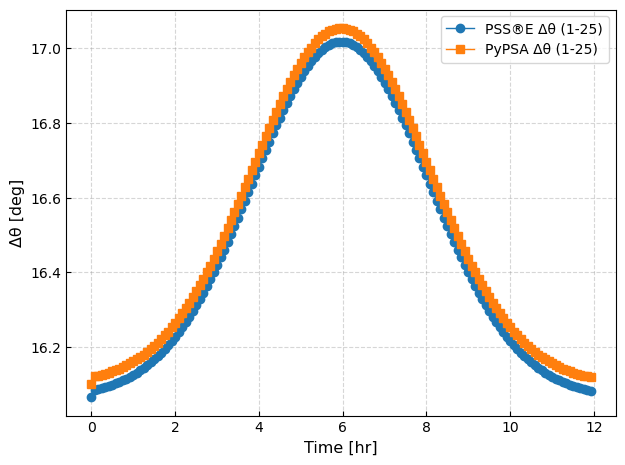

In [45]:
import numpy as np
# --- PSS®E ---
psse_angles = {"target": [], "swing": [], "time": []}
for snap in wec_grid.psseObj.snapshot_history:
    df = snap.buses
    t = snap.time
    for bus, key in [(25, "target"), (1, "swing")]:
        match = df[df["BUS_ID"] == bus]
        if not match.empty:
            psse_angles[key].append(match["ANGLE_RAD"].values[0])
    psse_angles["time"].append(t)

psse_theta = np.array(psse_angles["swing"]) - np.array(psse_angles["target"])
psse_time_hr = (pd.to_datetime(psse_angles["time"]) - pd.to_datetime(psse_angles["time"][0])).total_seconds() / 3600

# --- PyPSA ---
pypsa_swing = wec_grid.pypsaObj.pypsa_object.buses_t["v_ang"].loc[:, "1"]
pypsa_target = wec_grid.pypsaObj.pypsa_object.buses_t["v_ang"].loc[:, "25"]
pypsa_theta = np.rad2deg(pypsa_swing - pypsa_target)
pypsa_time_hr = (pypsa_swing.index - pypsa_swing.index[0]).total_seconds() / 3600

# Plot
import matplotlib.pyplot as plt

plt.plot(psse_time_hr, np.rad2deg(psse_theta), label="PSS®E Δθ (1-25)", marker='o', linewidth=1)
plt.plot(pypsa_time_hr, pypsa_theta, label="PyPSA Δθ (1-25)", marker='s', linewidth=1)
plt.xlabel("Time [hr]")
plt.ylabel("Δθ [deg]")
plt.grid(True, linestyle="--", alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()

In [7]:
wec_grid.pypsaObj.pypsa_object.buses_t['p'].loc[:, bus_id_str]

NameError: name 'bus_id_str' is not defined

In [26]:
wec_grid.psseObj.snapshot_history[0].buses.columns

Index(['BUS_ID', 'TYPE', 'Pd', 'Qd', 'Pg', 'Qg', 'P', 'Q', 'V_PU', 'V_KV',
       'BASE_KV', 'ANGLE_DEG', 'ANGLE_RAD', 'MISMATCH'],
      dtype='object')

In [38]:
wec_grid.pypsaObj.pypsa_object.buses_t.keys()

dict_keys(['v_mag_pu_set', 'p', 'q', 'v_mag_pu', 'v_ang', 'marginal_price'])

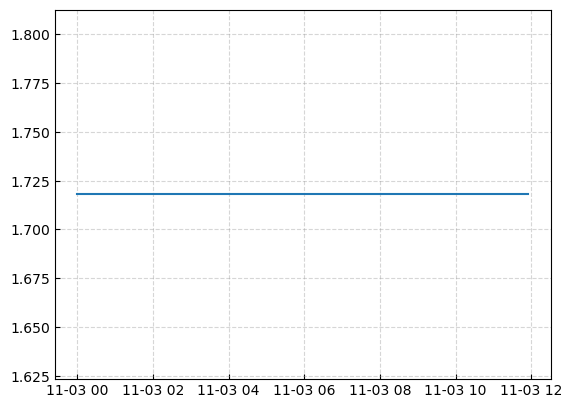

In [43]:
psse_values = []
psse_times = []
bus_id = 1
psse_p_col = 'ANGLE_RAD'
for snap in wec_grid.psseObj.snapshot_history:
    df = snap.buses
    match = df[df["BUS_ID"] == bus_id]
    if not match.empty and psse_p_col.upper() in match.columns:
        psse_values.append(match[psse_p_col.upper()].values[0])
        psse_times.append(snap.time)

psse_series = pd.Series(psse_values, index=pd.to_datetime(psse_times))
plt.plot(psse_series.index, psse_series.values)

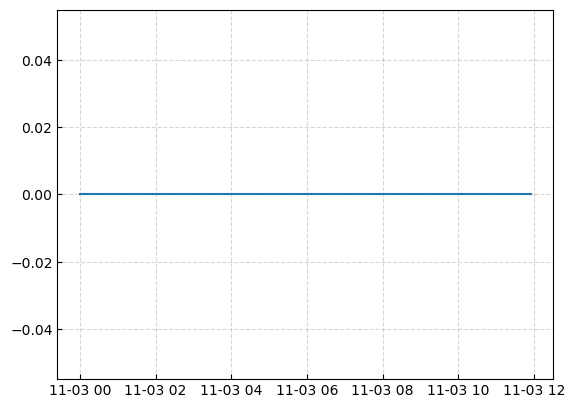

In [42]:
plt.plot(wec_grid.pypsaObj.pypsa_object.buses_t['v_ang'].loc[:, '1'].index,
         wec_grid.pypsaObj.pypsa_object.buses_t['v_ang'].loc[:, '1'].values)

In [12]:
wec_grid.pypsaObj.pypsa_object.buses_t['p'].loc[:, '31'].index

DatetimeIndex(['1997-11-03 00:00:00', '1997-11-03 00:05:00',
               '1997-11-03 00:10:00', '1997-11-03 00:15:00',
               '1997-11-03 00:20:00', '1997-11-03 00:25:00',
               '1997-11-03 00:30:00', '1997-11-03 00:35:00',
               '1997-11-03 00:40:00', '1997-11-03 00:45:00',
               ...
               '1997-11-03 11:10:00', '1997-11-03 11:15:00',
               '1997-11-03 11:20:00', '1997-11-03 11:25:00',
               '1997-11-03 11:30:00', '1997-11-03 11:35:00',
               '1997-11-03 11:40:00', '1997-11-03 11:45:00',
               '1997-11-03 11:50:00', '1997-11-03 11:55:00'],
              dtype='datetime64[ns]', name='snapshot', length=144, freq='5T')

In [26]:
pe.plot_generator_power_snapshots(
    wec_grid.psseObj,
    wec_grid.pypsaObj.pypsa_object,
    gen_id_psse="1 ",           # or actual string name like "G0"
    gen_id_pypsa="G0",         # Match the name used in PyPSA
    outfile_name="bus_1_generator_power.svg"
)

AttributeError: module 'plot_example' has no attribute 'plot_generator_power_snapshots'

In [12]:
for snap in wec_grid.psseObj.snapshot_history:
    print(snap.generators["GEN_ID"].unique())

['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G2' 'G3' 'G4' 'G5' 'G6' 'G7' 'G8']
['1 ' 'G1' 'G

In [6]:
import plot_example as pe

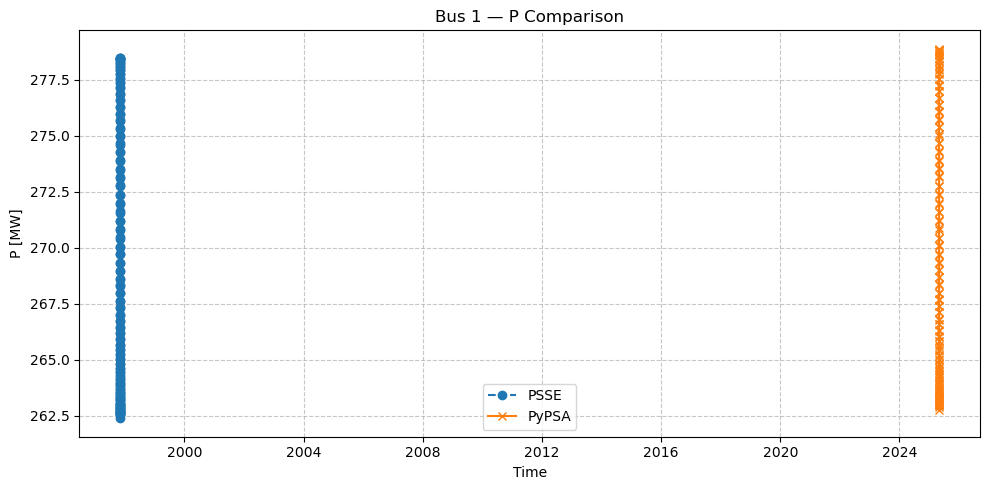

In [7]:
pe.compare_psse_pypsa_bus_power(wec_grid.psseObj, 
    wec_grid.pypsaObj.pypsa_object, 
    bus_id=1, 
    parameter="p"
)

In [20]:
pe.compare_psse_pypsa_bus_power_fixed(
    wec_grid.psseObj, 
    wec_grid.pypsaObj.pypsa_object, 
    bus_id=1, 
    parameter="p"
)

AttributeError: module 'plot_example' has no attribute 'compare_psse_pypsa_bus_power_fixed'

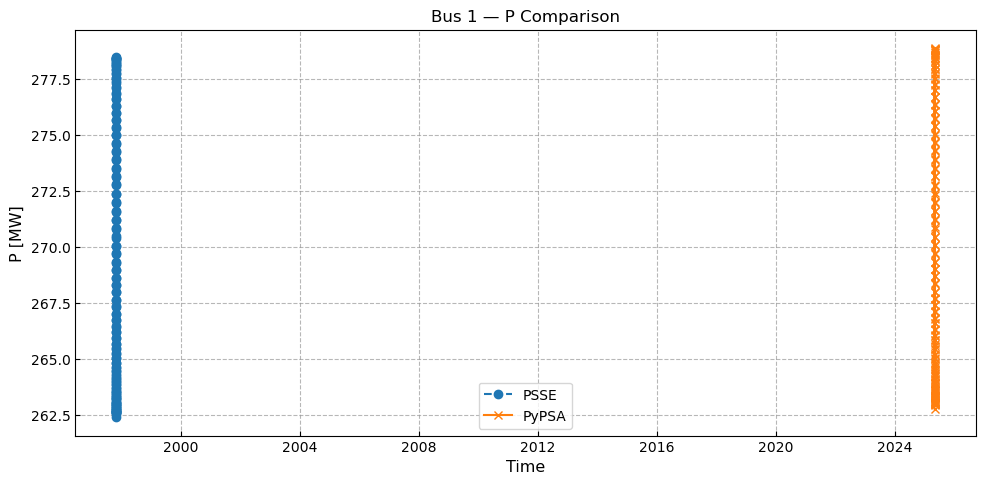

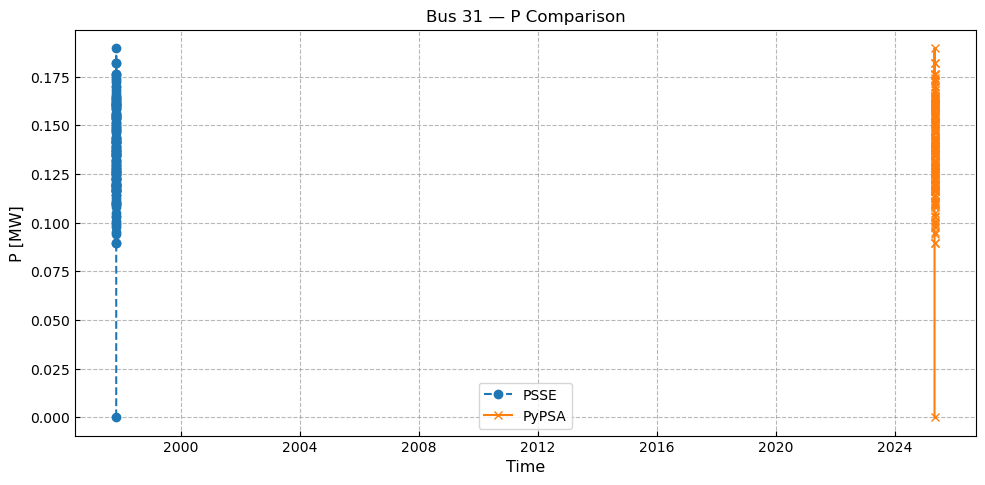

In [21]:

def compare_psse_pypsa_bus_power(psse_obj, pypsa_network, bus_id, parameter="p"):
    """
    Compare PSSE vs PyPSA bus results for a given parameter (default 'p').
    """
    # --- Extract PSSE data ---
    psse_values = []
    time_index = []

    for snap in psse_obj.snapshot_history:
        df = snap.buses
        match = df[df["BUS_ID"] == bus_id]
        if not match.empty:
            psse_values.append(match[parameter.upper()].values[0])
            time_index.append(snap.time)  # pull the snapshot timestamp

    psse_series = pd.Series(psse_values, index=pd.to_datetime(time_index))

    # --- Extract PyPSA data ---
    bus_id_str = str(bus_id)
    pypsa_series = getattr(pypsa_network.buses_t, parameter).loc[:, bus_id_str]

    # --- Align to minimum length ---
    min_len = min(len(psse_series), len(pypsa_series))
    psse_series = psse_series.iloc[:min_len]
    pypsa_series = pypsa_series.iloc[:min_len]

    # --- Plot ---
    plt.figure(figsize=(10, 5))
    plt.plot(psse_series.index, psse_series.values, label="PSSE", linestyle="--", marker="o")
    plt.plot(pypsa_series.index, pypsa_series.values, label="PyPSA", linestyle="-", marker="x")

    plt.title(f"Bus {bus_id} — {parameter.upper()} Comparison")
    plt.xlabel("Time")
    plt.ylabel(f"{parameter.upper()} [MW]")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.7)
    plt.tight_layout()
    plt.show()
    
compare_psse_pypsa_bus_power(
    wec_grid.psseObj, 
    wec_grid.pypsaObj.pypsa_object, 
    bus_id=1, 
    parameter="p"
)

compare_psse_pypsa_bus_power(
    wec_grid.psseObj, 
    wec_grid.pypsaObj.pypsa_object, 
    bus_id=31, 
    parameter="p"
)


In [4]:
wec_grid.psseObj.load_profiles

,2,3,4,5,7,8,10,12,14,15,...,17,18,19,20,21,23,24,26,29,30
1997-11-03 00:00:00,21.700001,2.400000,7.600000,94.199997,22.799999,30.000002,5.800000,11.200000,6.200000,8.200000,...,9.000000,3.200000,9.500000,2.200000,17.500000,3.200000,8.700000,3.500000,2.400000,10.600000
1997-11-03 00:05:00,21.722209,2.402456,7.607778,94.296401,22.823333,30.030704,5.805936,11.211462,6.206345,8.208392,...,9.009211,3.203275,9.509722,2.202252,17.517909,3.203275,8.708903,3.503582,2.402456,10.610848
1997-11-03 00:10:00,21.724779,2.402741,7.608678,94.307561,22.826034,30.034258,5.806623,11.212789,6.207079,8.209363,...,9.010277,3.203654,9.510848,2.202512,17.519983,3.203654,8.709934,3.503997,2.402741,10.612104
1997-11-03 00:15:00,21.727605,2.403053,7.609668,94.319826,22.829002,30.038164,5.807378,11.214247,6.207887,8.210431,...,9.011449,3.204071,9.512085,2.202799,17.522261,3.204071,8.711067,3.504452,2.403053,10.613484
1997-11-03 00:20:00,21.730704,2.403396,7.610753,94.333280,22.832259,30.042449,5.808207,11.215847,6.208772,8.211602,...,9.012734,3.204528,9.513442,2.203113,17.524761,3.204528,8.712309,3.504952,2.403396,10.614998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1997-11-03 11:35:00,21.730704,2.403396,7.610753,94.333280,22.832259,30.042449,5.808207,11.215847,6.208772,8.211602,...,9.012734,3.204528,9.513442,2.203113,17.524761,3.204528,8.712309,3.504952,2.403396,10.614998
1997-11-03 11:40:00,21.727605,2.403053,7.609668,94.319826,22.829002,30.038164,5.807378,11.214247,6.207887,8.210431,...,9.011449,3.204071,9.512085,2.202799,17.522261,3.204071,8.711067,3.504452,2.403053,10.613484
1997-11-03 11:45:00,21.724779,2.402741,7.608678,94.307561,22.826034,30.034258,5.806623,11.212789,6.207079,8.209363,...,9.010277,3.203654,9.510848,2.202512,17.519983,3.203654,8.709934,3.503997,2.402741,10.612104
1997-11-03 11:50:00,21.722209,2.402456,7.607778,94.296401,22.823333,30.030704,5.805936,11.211462,6.206345,8.208392,...,9.009211,3.203275,9.509722,2.202252,17.517909,3.203275,8.708903,3.503582,2.402456,10.610848


In [6]:
wec_grid.wecObj_list[0].dataframe

,time,ibus,pg,vs,pt,pb,qt,qb,snapshot
0,0.0,1.0,0.000000,1.0,0.000000,0.0,0.000000,0.000000,1997-11-03 00:00:00
1,450.0,1.0,0.016780,1.1,0.016780,0.0,0.057599,-0.057599,1997-11-03 00:05:00
2,750.0,1.0,0.016497,1.1,0.016497,0.0,0.057677,-0.057677,1997-11-03 00:10:00
3,1050.0,1.0,0.016940,1.1,0.016940,0.0,0.057533,-0.057533,1997-11-03 00:15:00
4,1350.0,1.0,0.017691,1.1,0.017691,0.0,0.057250,-0.057250,1997-11-03 00:20:00
...,...,...,...,...,...,...,...,...,...
139,41850.0,1.0,0.015768,1.1,0.015768,0.0,0.057798,-0.057798,1997-11-03 11:35:00
140,42150.0,1.0,0.022782,1.1,0.022782,0.0,0.055365,-0.055365,1997-11-03 11:40:00
141,42450.0,1.0,0.015574,1.1,0.015574,0.0,0.057925,-0.057925,1997-11-03 11:45:00
142,42750.0,1.0,0.014986,1.1,0.014986,0.0,0.058083,-0.058083,1997-11-03 11:50:00


In [16]:
bus_df, gen_df = wec_grid.pypsaObj.collect_pypsa_data()

In [17]:
bus_df

,v_mag_pu,v_ang,p,q,snapshot,bus
0,1.060000,0.000000,262.765580,118.611959,2025-04-29 16:02:06.659457,1
1,1.043130,-0.093698,18.300000,52.580057,2025-04-29 16:02:06.659457,2
2,1.015641,-0.130549,-2.400000,-1.200000,2025-04-29 16:02:06.659457,3
3,1.006415,-0.161313,-7.600000,-1.600000,2025-04-29 16:02:06.659457,4
4,1.010000,-0.248115,-94.200000,24.384517,2025-04-29 16:02:06.659457,5
...,...,...,...,...,...,...
4459,1.008413,-0.273386,0.000000,0.000000,2025-04-30 03:57:06.659457,27
4460,1.000645,-0.203337,0.000000,0.000000,2025-04-30 03:57:06.659457,28
4461,0.988236,-0.295526,-2.402198,-0.900000,2025-04-30 03:57:06.659457,29
4462,0.976566,-0.311432,-10.609707,-1.900000,2025-04-30 03:57:06.659457,30


In [18]:
# Non wec for comparison
wec_grid_no_wec = WecGrid(case="../WecGrid/models/grid_models/IEEE_24_bus.RAW")
wec_grid_no_wec.initialize_psse("fnsl")
wec_grid_no_wec.initialize_pypsa("fnsl")


 Reading IC, SBASE, REV, XFRRAT, NXFRAT, BASFRQ...

 Converting RAW data from PSS(R)E 33 to PSS(R)E 34 format
 Starting processing of Case identification data records
 Finished processing of 3 records for Case identification data
 Starting processing of Bus data records
 Finished processing of 24 records for Bus data
 Starting processing of Load data records
 Finished processing of 16 records for Load data
 Starting processing of Fixed shunt data records
 Finished processing of 0 records for Fixed shunt data
 Starting processing of Generator data records
 Finished processing of 11 records for Generator data
 Starting processing of Branch data records
 Finished processing of 32 records for Branch data
 Finished processing of 0 records for System switching device data
 Starting processing of Transformer data records
 Finished processing of 24 records for 6 Transformer data
 Starting processing of Area data records
 Finished processing of 1 records for Area data
 Starting processing of T

case data: 0     100.00  33  0  0  60.00       
record 1: 
record 2: 
parsed 24 buses
parsed 16 loads
parsed 0 fixed shunts
parsed 11 generators
parsed 32 branches
parsed 6 transformers
parsed 1 areas
parsed 0 two terminal dc lines
parsed 0 vsc dc lines
parsed 0 transformer corrections
parsed 0 multi-terminal dc lines
parsed 0 multi-section lines
parsed 1 zones
parsed 0 inter-area transfers
parsed 1 owners
parsed 0 facts devices
parsed 2 switched shunts
parsed 0 induction machines
un-parsed lines:
  Q

INFO:pypsa.pf:Performing non-linear load-flow on AC sub-network SubNetwork 0 for snapshots Index(['now'], dtype='object', name='snapshot')
INFO:pypsa.pf:Newton-Raphson solved in 5 iterations with error of 0.000000 in 0.046883 seconds


pyPSA initialized
PyPSA initialized with case file: IEEE_24_bus.RAW.


In [19]:
wec_grid_no_wec.pypsaObj.simulate(load_curve=True, sim_length=len(wec_grid.wecObj_list[0].dataframe.time.to_list()))

INFO:pypsa.pf:Performing non-linear load-flow on AC sub-network SubNetwork 0 for snapshots DatetimeIndex(['2025-04-29 16:07:31.884288', '2025-04-29 16:12:31.884288',
               '2025-04-29 16:17:31.884288', '2025-04-29 16:22:31.884288',
               '2025-04-29 16:27:31.884288', '2025-04-29 16:32:31.884288',
               '2025-04-29 16:37:31.884288', '2025-04-29 16:42:31.884288',
               '2025-04-29 16:47:31.884288', '2025-04-29 16:52:31.884288',
               ...
               '2025-04-30 03:17:31.884288', '2025-04-30 03:22:31.884288',
               '2025-04-30 03:27:31.884288', '2025-04-30 03:32:31.884288',
               '2025-04-30 03:37:31.884288', '2025-04-30 03:42:31.884288',
               '2025-04-30 03:47:31.884288', '2025-04-30 03:52:31.884288',
               '2025-04-30 03:57:31.884288', '2025-04-30 04:02:31.884288'],
              dtype='datetime64[ns]', name='snapshot', length=144, freq='5T')


✅ Generated load curve for 16 loads over 144 steps.


INFO:pypsa.pf:Newton-Raphson solved in 5 iterations with error of 0.000000 in 0.046889 seconds
INFO:pypsa.pf:Newton-Raphson solved in 5 iterations with error of 0.000000 in 0.046857 seconds
INFO:pypsa.pf:Newton-Raphson solved in 5 iterations with error of 0.000000 in 0.046868 seconds
INFO:pypsa.pf:Newton-Raphson solved in 5 iterations with error of 0.000000 in 0.046871 seconds
INFO:pypsa.pf:Newton-Raphson solved in 5 iterations with error of 0.000000 in 0.046873 seconds
INFO:pypsa.pf:Newton-Raphson solved in 5 iterations with error of 0.000000 in 0.046870 seconds
INFO:pypsa.pf:Newton-Raphson solved in 5 iterations with error of 0.000000 in 0.046886 seconds
INFO:pypsa.pf:Newton-Raphson solved in 5 iterations with error of 0.000000 in 0.046872 seconds
INFO:pypsa.pf:Newton-Raphson solved in 5 iterations with error of 0.000000 in 0.046884 seconds
INFO:pypsa.pf:Newton-Raphson solved in 5 iterations with error of 0.000000 in 0.046860 seconds
INFO:pypsa.pf:Newton-Raphson solved in 5 iteration

In [22]:
wec_grid_no_wec.psseObj.simulate(load_curve=True, duration_len=len(wec_grid.wecObj_list[0].dataframe.time.to_list()))

Starting Sim ... 

 No power flow data changed for load "1" at bus 2 [2           138.00]
Load at bus 2 updated to 97.0 MW for snapshot 1997-11-03 00:00:00.

 No power flow data changed for load "1" at bus 3 [3           138.00]
Load at bus 3 updated to 90.0 MW for snapshot 1997-11-03 00:00:00.

 No power flow data changed for load "1" at bus 4 [4           138.00]
Load at bus 4 updated to 74.0 MW for snapshot 1997-11-03 00:00:00.

 No power flow data changed for load "1" at bus 5 [5           138.00]
Load at bus 5 updated to 71.0 MW for snapshot 1997-11-03 00:00:00.

 No power flow data changed for load "1" at bus 6 [6           138.00]
Load at bus 6 updated to 68.0 MW for snapshot 1997-11-03 00:00:00.

 No power flow data changed for load "1" at bus 7 [7           138.00]
Load at bus 7 updated to 62.0 MW for snapshot 1997-11-03 00:00:00.

 No power flow data changed for load "1" at bus 8 [8           230.00]
Load at bus 8 updated to 85.0 MW for snapshot 1997-11-03 00:00:00.

 No powe

In [11]:
import pandas as pd
import os

def export_wec_grid_results(wec_grid, folder="wecgrid_exports"):
    """
    Save PSSE and PyPSA results from wec_grid object into a folder.
    """

    os.makedirs(folder, exist_ok=True)

    # --- PSSE ---
    psse_snapshots = []
    for snap in wec_grid.psseObj.snapshot_history:
        temp = snap.buses.copy()
        temp["timestamp"] = snap.time
        psse_snapshots.append(temp)
    psse_df = pd.concat(psse_snapshots, ignore_index=True)

    psse_df.to_csv(os.path.join(folder, "psse_snapshots.csv"), index=False)
    wec_grid.psseObj.bus_dataframe.to_csv(os.path.join(folder, "psse_buses.csv"), index=False)
    wec_grid.psseObj.gen_dataframe.to_csv(os.path.join(folder, "psse_generators.csv"), index=False)

    # --- PyPSA ---
    bus_df, gen_df = wec_grid.pypsaObj.collect_pypsa_data()

    bus_df.to_csv(os.path.join(folder, "pypsa_buses.csv"), index=False)
    gen_df.to_csv(os.path.join(folder, "pypsa_generators.csv"), index=False)

    print(f"✅ Saved results to {folder}/")

# Example usage:
export_wec_grid_results(wec_grid, folder="wecgrid_with_wecs")
export_wec_grid_results(wec_grid_no_wec, folder="wecgrid_no_wecs")

✅ Saved results to wecgrid_with_wecs/


NameError: name 'wec_grid_no_wec' is not defined

In [ ]:
import plot_example as pe

pe.compare_psse_pypsa_bus_power(
    wec_grid.psseObj, 
    wec_grid.pypsaObj.pypsa_object, 
    bus_id=1, 
    parameter="p"
)

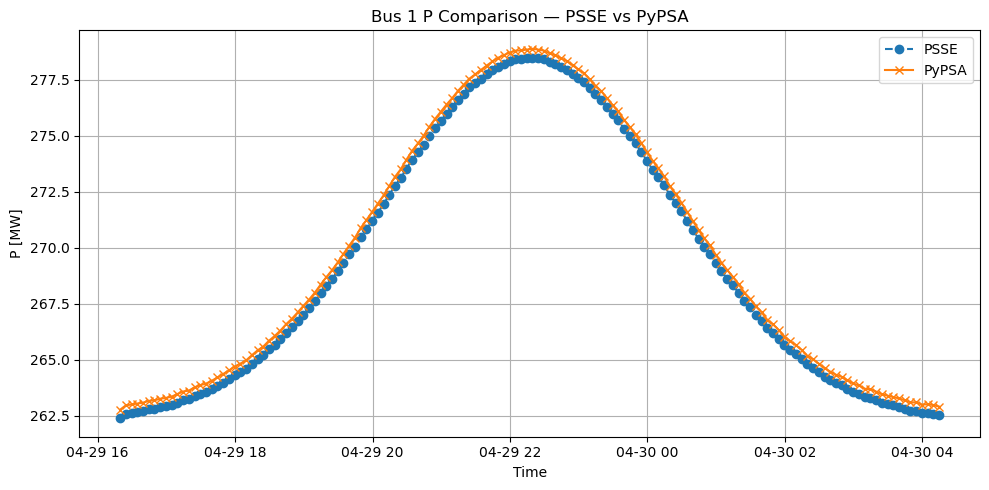

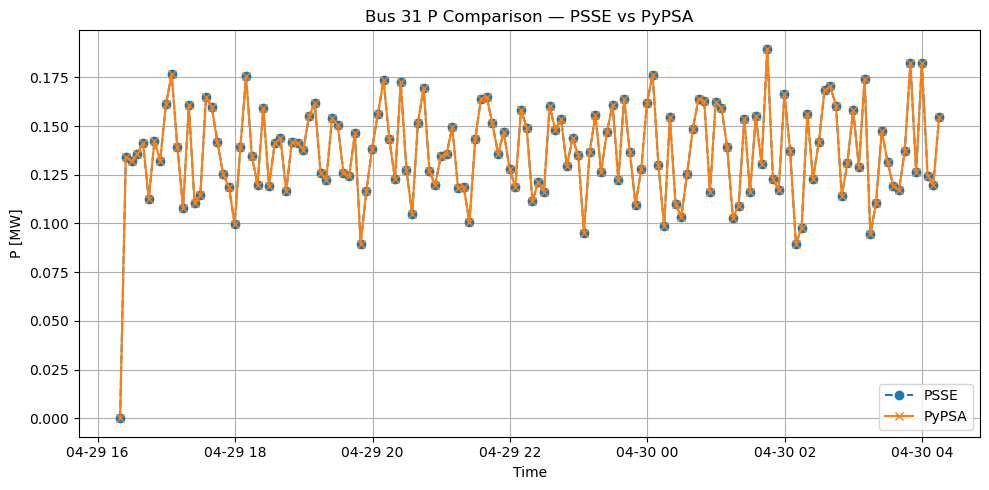

In [13]:
def compare_psse_pypsa_bus_power_fixed(psse_obj, pypsa_network, bus_id, parameter="p", skip_first_psse=False):
    # --- PSSE side ---
    psse_values = []

    snapshots = psse_obj.snapshot_history[2:] if skip_first_psse else psse_obj.snapshot_history

    for snap in snapshots:
        df = snap.buses
        match = df[df["BUS_ID"] == bus_id]
        if not match.empty and parameter.upper() in match.columns:
            psse_values.append(match[parameter.upper()].values[0])  # PSSE uses capital letters

    # --- PyPSA side ---
    bus_id_str = str(bus_id)
    pypsa_series = getattr(pypsa_network.buses_t, parameter).loc[:, bus_id_str]

    # --- Align indices ---
    if len(psse_values) != len(pypsa_series):
        print(f"⚠️ Length mismatch: PSSE ({len(psse_values)}) vs PyPSA ({len(pypsa_series)}). Truncating to min.")
    min_len = min(len(psse_values), len(pypsa_series))

    psse_series = pd.Series(psse_values[:min_len], index=pypsa_series.index[:min_len])
    pypsa_series = pypsa_series.iloc[:min_len]

    # --- Plot ---
    plt.figure(figsize=(10, 5))
    plt.plot(psse_series.index, psse_series.values, label="PSSE", marker="o", linestyle="--")
    plt.plot(pypsa_series.index, pypsa_series.values, label="PyPSA", marker="x", linestyle="-")

    plt.title(f"Bus {bus_id} {parameter.upper()} Comparison — PSSE vs PyPSA")
    plt.xlabel("Time")
    plt.ylabel(f"{parameter.upper()} [MW]")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
    
compare_psse_pypsa_bus_power_fixed(
    wec_grid.psseObj, 
    wec_grid.pypsaObj.pypsa_object, 
    bus_id=1, 
    parameter="p"
)

compare_psse_pypsa_bus_power_fixed(
    wec_grid.psseObj, 
    wec_grid.pypsaObj.pypsa_object, 
    bus_id=31, 
    parameter="p"
)


In [13]:
len(wec_grid.psseObj.snapshot_history)

144

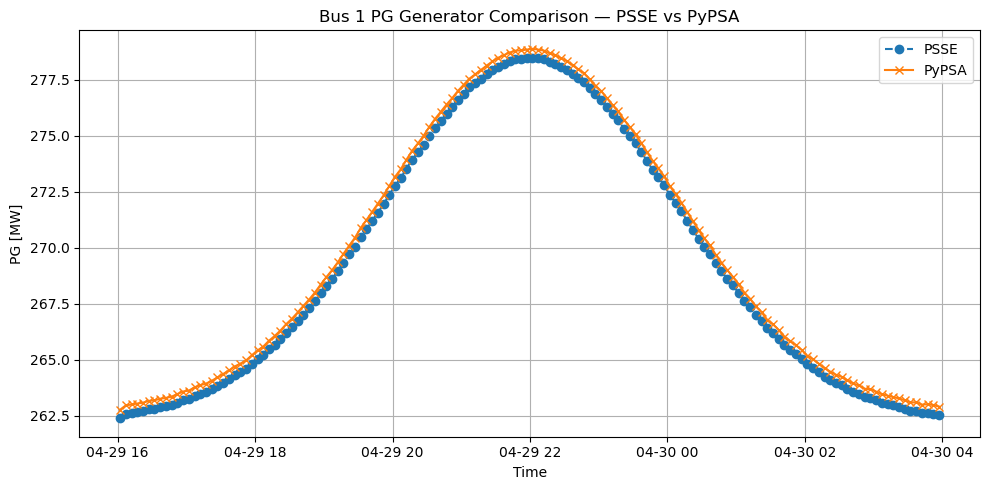

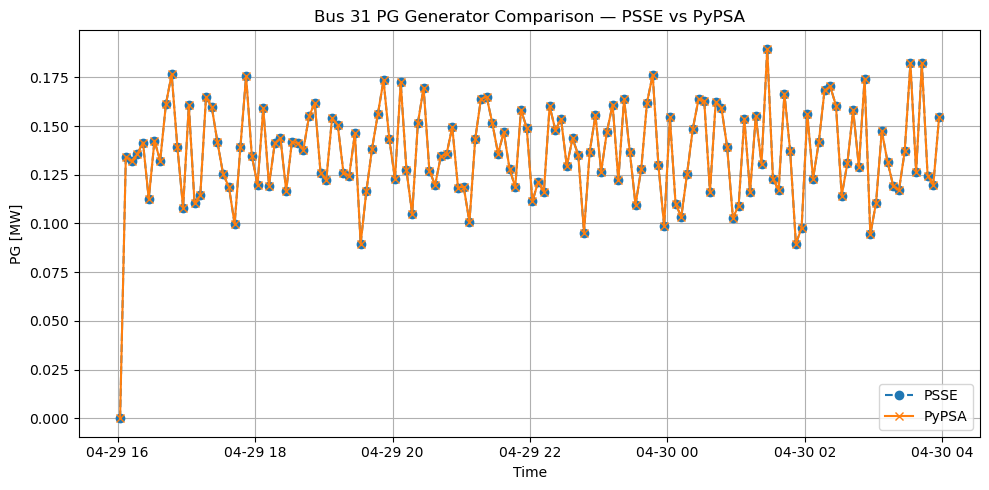

In [14]:
def compare_psse_pypsa_gen_power_fixed(psse_obj, pypsa_network, bus_id, parameter="p", skip_first_psse=False):
    # --- PSSE side (GENERATOR-LEVEL) ---
    psse_values = []

    snapshots = psse_obj.snapshot_history[2:] if skip_first_psse else psse_obj.snapshot_history

    for snap in snapshots:
        df = snap.generators  # ⚡ LOOK: now using GENERATORS not buses
        match = df[df["BUS_ID"] == bus_id]
        if not match.empty and parameter.capitalize() in match.columns:
            psse_values.append(match[parameter.capitalize()].sum())  # Sum all gens at this bus

    # --- PyPSA side (still generator level) ---
    bus_id_str = str(bus_id)
    gen_mask = pypsa_network.generators.bus == bus_id_str
    gen_names = pypsa_network.generators.index[gen_mask]

    pypsa_series = getattr(pypsa_network.generators_t, 'p')[gen_names].sum(axis=1)

    # --- Align indices ---
    if len(psse_values) != len(pypsa_series):
        print(f"⚠️ Length mismatch: PSSE ({len(psse_values)}) vs PyPSA ({len(pypsa_series)}). Truncating to min.")
    min_len = min(len(psse_values), len(pypsa_series))

    psse_series = pd.Series(psse_values[:min_len], index=pypsa_series.index[:min_len])
    pypsa_series = pypsa_series.iloc[:min_len]

    # --- Plot ---
    plt.figure(figsize=(10, 5))
    plt.plot(psse_series.index, psse_series.values, label="PSSE", marker="o", linestyle="--")
    plt.plot(pypsa_series.index, pypsa_series.values, label="PyPSA", marker="x", linestyle="-")

    plt.title(f"Bus {bus_id} {parameter.upper()} Generator Comparison — PSSE vs PyPSA")
    plt.xlabel("Time")
    plt.ylabel(f"{parameter.upper()} [MW]")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    
compare_psse_pypsa_gen_power_fixed(
    wec_grid.psseObj, 
    wec_grid.pypsaObj.pypsa_object, 
    bus_id=1, 
    parameter="Pg"
)

compare_psse_pypsa_gen_power_fixed(
    wec_grid.psseObj, 
    wec_grid.pypsaObj.pypsa_object, 
    bus_id=31, 
    parameter="Pg"
)

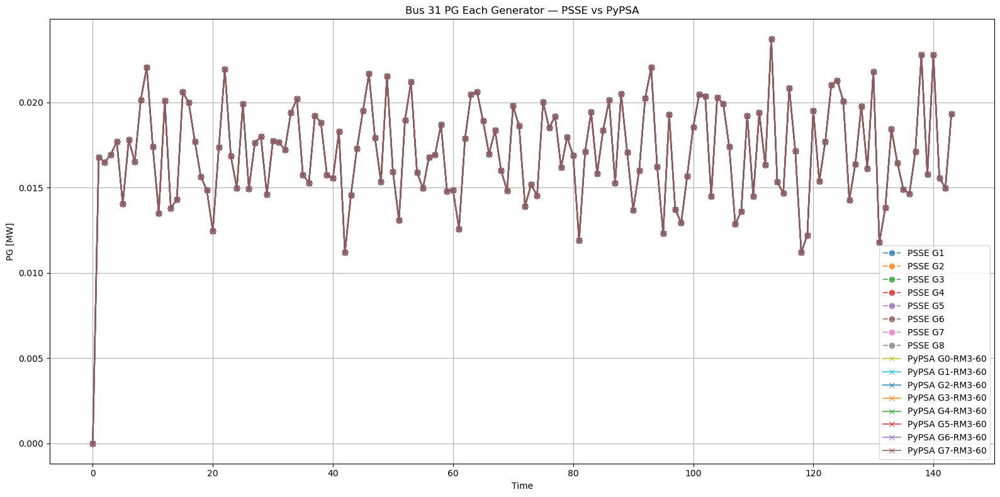

In [15]:
def compare_psse_pypsa_each_generator(psse_obj, pypsa_network, bus_id, parameter="p", skip_first_psse=False):
    """
    Compare each generator on a bus between PSSE and PyPSA.

    Args:
        psse_obj: PSSE wrapper object
        pypsa_network: PyPSA network object
        bus_id: Bus number (int)
        parameter: 'p' (active power) or 'q' (reactive power)
        skip_first_psse: Whether to skip first snapshot
    """
    # --- PSSE side ---
    snapshots = psse_obj.snapshot_history[2:] if skip_first_psse else psse_obj.snapshot_history

    # Create a dictionary of PSSE generators
    psse_generators = {}
    for snap in snapshots:
        df = snap.generators
        matches = df[df["BUS_ID"] == bus_id]
        for idx, row in matches.iterrows():
            gen_id = row["GEN_ID"].strip()
            if gen_id not in psse_generators:
                psse_generators[gen_id] = []
            psse_generators[gen_id].append(row[parameter])

    # --- PyPSA side ---
    bus_id_str = str(bus_id)
    gen_names = pypsa_network.generators.index[pypsa_network.generators.bus == bus_id_str]

    # Create a dictionary of PyPSA generators
    pypsa_generators = {}
    for gen_name in gen_names:
        pypsa_generators[gen_name] = getattr(pypsa_network.generators_t, 'p')[gen_name]

    # --- Align snapshots ---
    min_len = min(min(len(snapshots), *[len(v) for v in psse_generators.values()]),
                  min([len(v) for v in pypsa_generators.values()]))

    # --- Plot ---
    plt.figure(figsize=(16, 8))

    for gen_id, values in psse_generators.items():
        plt.plot(
            range(min_len),
            values[:min_len],
            label=f"PSSE {gen_id}",
            marker="o",
            linestyle="--",
            alpha=0.7,
        )

    for gen_name, series in pypsa_generators.items():
        plt.plot(
            range(min_len),
            series.iloc[:min_len],
            label=f"PyPSA {gen_name}",
            marker="x",
            linestyle="-",
            alpha=0.7,
        )

    plt.title(f"Bus {bus_id} {parameter.upper()} Each Generator — PSSE vs PyPSA")
    plt.xlabel("Time")
    plt.ylabel(f"{parameter.upper()} [MW]")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
compare_psse_pypsa_each_generator(
    wec_grid.psseObj, 
    wec_grid.pypsaObj.pypsa_object, 
    bus_id=31, 
    parameter="Pg"
)

In [21]:
num_timesteps = len(wec_grid.psseObj.snapshot_history)  # Or pypsa snapshots
timestamps = [i * 300 for i in range(num_timesteps)]  # in seconds

In [23]:
len(timestamps)

146

In [33]:
len(wec_grid.pypsaObj.pypsa_object.snapshots)

144

In [ ]:
import pandas as pd

def collect_pypsa_data(pypsa_obj):
    bus_records = []
    gen_records = []

    for idx, snap in enumerate(pypsa_obj.snapshots):
        #seconds = idx * 300  # 5 minute timestep = 300 seconds
        
        # Buses
        buses = pd.DataFrame({
            "v_mag_pu": pypsa_obj.buses_t.v_mag_pu.loc[snap],
            "v_ang": pypsa_obj.buses_t.v_ang.loc[snap],
            "p": pypsa_obj.buses_t.p.loc[snap],
            "q": pypsa_obj.buses_t.q.loc[snap],
        })
        buses["timestamp"] = seconds
        buses["bus"] = buses.index
        bus_records.append(buses.reset_index(drop=True))
        
        # Generators
        gens = pd.DataFrame({
            "p_set": pypsa_obj.generators_t.p_set.loc[snap],
            "p": pypsa_obj.generators_t.p.loc[snap],
            "q": pypsa_obj.generators_t.q.loc[snap],
            "status": pypsa_obj.generators_t.status.loc[snap],
        })
        gens["timestamp"] = seconds
        gens["generator"] = gens.index
        gen_records.append(gens.reset_index(drop=True))

    bus_df = pd.concat(bus_records, ignore_index=True)
    gen_df = pd.concat(gen_records, ignore_index=True)

    return bus_df, gen_df

In [36]:
bus_df, gen_df = collect_pypsa_data(wec_grid.pypsaObj.pypsa_object)

In [38]:
gen_df

,p_set,p,q,status,timestamp,generator
0,NaN,262.76558,118.611959,NaN,0,G0
1,0.00000,0.00000,-119.864453,NaN,0,G0-RM3-60
2,NaN,40.00000,65.280057,NaN,0,G1
3,0.00000,0.00000,0.000000,NaN,0,G1-RM3-60
4,NaN,0.00000,43.384517,NaN,0,G2
...,...,...,...,...,...,...
2011,0.01931,0.01931,0.000000,NaN,42900,G4-RM3-60
2012,NaN,0.00000,17.799225,NaN,42900,G5
2013,0.01931,0.01931,0.000000,NaN,42900,G5-RM3-60
2014,0.01931,0.01931,0.000000,NaN,42900,G6-RM3-60


In [32]:
wec_grid.pypsaObj.pypsa_object.generators_t.keys()

dict_keys(['p_min_pu', 'p_max_pu', 'p_set', 'q_set', 'marginal_cost', 'p', 'q', 'status', 'mu_upper', 'mu_lower', 'mu_p_set', 'mu_ramp_limit_up', 'mu_ramp_limit_down'])

In [46]:
skip_first_psse = True
bus_id = 31
parameter = 'Pg'
# --- PSSE side ---
snapshots = wec_grid.psseObj.snapshot_history[2:] if skip_first_psse else wec_grid.psseObj.snapshot_history

# Create a dictionary of PSSE generators
psse_generators = {}
for snap in snapshots:
    df = snap.generators
    matches = df[df["BUS_ID"] == bus_id]
    for idx, row in matches.iterrows():
        gen_id = row["GEN_ID"].strip()
        if gen_id not in psse_generators:
            psse_generators[gen_id] = []
        psse_generators[gen_id].append(row[parameter])

In [44]:
wec_grid.psseObj.gen_dataframe

,BUS_ID,GEN_ID,Pg,Qg,MBASE,STATUS
0,1,1,262.738068,110.283066,100.0,1
1,2,1,40.000000,50.000000,100.0,1
2,5,1,0.000000,36.960880,100.0,1
3,8,1,0.000000,37.247555,100.0,1
4,11,1,0.000000,16.184494,100.0,1
5,13,1,0.000000,10.642446,100.0,1
6,31,G1,0.019483,-15.117504,1.0,1
7,31,G2,0.018951,-14.704349,1.0,1
8,31,G3,0.019506,-15.135412,1.0,1
9,31,G4,0.019435,-15.079949,1.0,1


In [31]:
# --- PyPSA side ---
bus_id_str = str(31)
gen_names = wec_grid.pypsaObj.pypsa_object.generators.index[ wec_grid.pypsaObj.pypsa_object.generators.bus == bus_id_str]

# Create a dictionary of PyPSA generators
pypsa_generators = {}
for gen_name in gen_names:
    pypsa_generators[gen_name] = getattr( wec_grid.pypsaObj.pypsa_object.generators_t, 'p')[gen_name]
    
for gen_name, series in pypsa_generators.items():
    plt.plot(
        range(min_len),
        series.iloc[:min_len],
        label=f"PyPSA {gen_name}",
        marker="x",
        linestyle="-",
        alpha=0.7,
    )

NameError: name 'min_len' is not defined

In [30]:
series

snapshot
2025-04-28 00:25:15.175658    0.000000
2025-04-28 00:30:15.175658    0.016529
2025-04-28 00:35:15.175658    0.016299
2025-04-28 00:40:15.175658    0.016716
2025-04-28 00:45:15.175658    0.017699
                                ...   
2025-04-28 12:00:15.175658    0.015827
2025-04-28 12:05:15.175658    0.023082
2025-04-28 12:10:15.175658    0.015628
2025-04-28 12:15:15.175658    0.014960
2025-04-28 12:20:15.175658    0.019008
Freq: 5T, Name: G0-RM3-60, Length: 144, dtype: float64

In [15]:
wec_grid.pypsaObj.pypsa_object.generators.bus == '31'

Generator
G0           False
G1           False
G2           False
G3           False
G4           False
G5           False
G0-RM3-60     True
G1-RM3-60     True
G2-RM3-60     True
G3-RM3-60     True
G4-RM3-60     True
G5-RM3-60     True
G6-RM3-60     True
G7-RM3-60     True
Name: bus, dtype: bool

In [7]:
df_gen = wec_grid.psseObj.snapshot_generators()
print(df_gen[df_gen["BUS_ID"] == 25])

Empty DataFrame
Columns: [BUS_ID, GEN_ID, Pg, Qg, MBASE, STATUS, MISMATCH, PERCENT]
Index: []


In [9]:
wec_grid.psseObj.gen_dataframe

,BUS_ID,GEN_ID,Pg,Qg,MBASE,STATUS,MISMATCH,PERCENT
0,1,1,35.829842,180.390244,100.0,1,0.000018,183.914169
1,2,1,67.000000,0.000000,100.0,1,0.000012,67.000000
2,7,1,64.000000,0.000000,100.0,1,0.000000,64.000000
3,13,1,200.000000,0.000000,100.0,1,0.000001,200.000000
4,14,1,0.000000,0.000000,100.0,1,0.000000,0.000000
5,15,1,274.000000,0.000000,100.0,1,0.000024,274.000000
6,16,1,245.000000,0.000000,100.0,1,0.000006,245.000000
7,18,1,144.000000,0.000000,100.0,1,0.000000,144.000000
8,21,1,294.000000,0.000000,100.0,1,0.000006,294.000000
9,22,1,150.000000,199.301117,100.0,1,0.000012,249.441238


In [7]:
wec_grid.pypsaObj.pypsa_object.generators

attribute,bus,control,type,p_nom,p_nom_extendable,p_nom_min,p_nom_max,p_min_pu,p_max_pu,p_set,...,shut_down_cost,min_up_time,min_down_time,up_time_before,down_time_before,ramp_limit_up,ramp_limit_down,ramp_limit_start_up,ramp_limit_shut_down,p_nom_opt
Generator,,,,,,,,,,,,,,,,,,,,,
G0,1,Slack,,1000.0,False,0.0,inf,0.0,1.0,35.849,...,0.0,0,0,1,0,NaN,NaN,1.0,1.0,0.0
G1,2,PV,,1000.0,False,0.0,inf,0.0,1.0,67.000,...,0.0,0,0,1,0,NaN,NaN,1.0,1.0,0.0
G2,7,PV,,1000.0,False,0.0,inf,0.0,1.0,64.000,...,0.0,0,0,1,0,NaN,NaN,1.0,1.0,0.0
G3,13,PV,,1000.0,False,0.0,inf,0.0,1.0,200.000,...,0.0,0,0,1,0,NaN,NaN,1.0,1.0,0.0
G4,14,PV,,1000.0,False,0.0,inf,0.0,1.0,0.000,...,0.0,0,0,1,0,NaN,NaN,1.0,1.0,0.0
G5,15,PV,,1000.0,False,0.0,inf,0.0,1.0,274.000,...,0.0,0,0,1,0,NaN,NaN,1.0,1.0,0.0
G6,16,PV,,1000.0,False,0.0,inf,0.0,1.0,245.000,...,0.0,0,0,1,0,NaN,NaN,1.0,1.0,0.0
G7,18,PV,,1000.0,False,0.0,inf,0.0,1.0,144.000,...,0.0,0,0,1,0,NaN,NaN,1.0,1.0,0.0
G8,21,PV,,1000.0,False,0.0,inf,0.0,1.0,294.000,...,0.0,0,0,1,0,NaN,NaN,1.0,1.0,0.0


In [3]:
psspy = wec_grid.psseObj.psspy

In [4]:
ierr, pgen = psspy.macdat(25, '1 ', 'P')

In [6]:
ierr

2

In [10]:
pg_values = psspy.amachreal(-1, 4, "PGEN")
pg_values[1][0][-1]

9.999999747378752e-05

In [ ]:
psspy = wec_grid.psseObj.psspy
ierr, bus_ids = psspy.abusint(-1, 1, 'NUMBER')  # in-service buses
bus_ids = bus_ids[0]
ierr, rarray = psspy.abusreal(-1,1,'MISMATCH') # Bus mismatch, in MVA for all buses

for i in range(len(bus_ids)):
    bus = bus_ids[i]
    ierr, cmpval = psspy.busdt2(bus, 'TOTAL', 'ACT')
    Pd = cmpval.real if ierr == 0 else 0.0
    Qd = cmpval.imag if ierr == 0 else 0.0

    ierr, cmpval_gen = psspy.gendat(bus)
    Pg = cmpval_gen.real if ierr == 0 else 0.0
    Qg = cmpval_gen.imag if ierr == 0 else 0.0
    
    # if bus == 25:
    #     print(f"Bus {bus}: Pd = {Pd}, Qd = {Qd}, Pg = {Pg}, Qg = {Qg}")
    #     print(f"Bus {bus}: Mismatch = {rarray[0][i]}")
    #     print(f"Bus {bus}: Total Power = {Pg - Pd} + j({Qg - Qd})")
    #     print(f"Bus {bus}: Total Power = {abs(Pg - Pd) + abs(Qg - Qd)}")
    #     print(f"Bus {bus}: Total Power = {abs(rarray[0][i])}")
        
ierr1, bus_numbers = psspy.amachint(-1, 4, "NUMBER")
ierr2, gen_ids = psspy.amachchar(-1, 4, "ID")
ierr3, pg_values = psspy.amachreal(-1, 4, "PGEN")
ierr4, qg_values = psspy.amachreal(-1, 4, "QGEN")
ierr5, mbase_values = psspy.amachreal(-1, 4, "MBASE")
ierr6, status_vals = psspy.amachint(-1, 4, "STATUS")
ierr7, mismatch_vals = psspy.agenbusreal(-1,1,'MISMATCH') # Bus mismatch, in MVA 
ierr8, percent_vals = psspy.agenbusreal(-1,1,'PERCENT') # Bus mismatch, in MVA 

for elem in [bus_numbers, gen_ids, pg_values, qg_values, mbase_values, status_vals, mismatch_vals, percent_vals]:
    print(len(elem[0]))
